In [30]:
import matplotlib.backends.backend_pdf
import scanpy as sc
import matplotlib.pyplot as pl
import anndata as ad
import pandas as pd
import numpy as np
import os
import sys
import scvelo as scv
scv.settings.verbosity=1
import scvi
from tqdm.notebook import tqdm
from pathlib import Path

# Jupyter stuff
from IPython.display import clear_output
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:99% !important; }</style>"))

# Paths and utils
root = Path('../../')
figure_path = root / 'results/figures/'
data_path = root / 'data/'
deseq2_results_path = root / 'results/DESeq2/hamster/'
# BIH
tmp_path = Path('/fast/scratch/users/peidlis_c/')
utils_path = Path('/fast/work/users/peidlis_c/utils/single_cell_rna_seq/scrnaseq_utils/')
# local
tmp_path = data_path
utils_path = '/Users/stefanpeidli/work/utils/scrnaseq_utils/'

sys.path.insert(1, utils_path)
from scrnaseq_util_functions import *

%matplotlib inline

In [31]:
def plot_timecourse(adata, key, x='time', hue='organism', ci=99, markers=True, linewidth=2, **kwargs):
    keys = [key] if type(key)==str else key
    N = len(keys)
    fig, axs = pl.subplots(1,N, figsize=[6*N,4], dpi=100)
    axs = [axs] if N==1 else axs
    for key, ax in zip(keys, axs):
        df = extract_df(adata, [key, x, hue])
        sns.lineplot(data=df, y=key, x=x, hue=hue, ci=ci, markers=markers, linewidth=linewidth, ax=ax, **kwargs)
        ax.set_title(key)

def plot_timecourse_dose(adata, key, x='time', ci=99, markers=True, linewidth=2, **kwargs):
    keys = [key] if type(key)==str else key
    N = len(keys)
    with sns.axes_style('whitegrid'):
        fig, axs = pl.subplots(1,N, figsize=[8*N,5], dpi=80)
    axs = [axs] if N==1 else axs
    for key, ax in zip(keys, axs):
        df = extract_df(adata, [key, x, 'organism', 'dosage', 'organism_dosage'])
        df_ = df[df.organism_dosage=='Dwarfhamster_no dose']
        df = df[df.organism_dosage!='Dwarfhamster_no dose']
        df_['organism_dosage'] = 'Dwarfhamster_low dose'
        df = pd.concat([df, df_])
        df_['organism_dosage'] = 'Dwarfhamster_high dose'
        df = pd.concat([df, df_])
        df.organism_dosage[df.organism_dosage.isin(['Goldhamster_no dose', 'Goldhamster_high dose'])] = 'Goldhamster'
        df.index = np.sum(np.vstack([df.index, np.arange(len(df)).astype(str)]), axis=0)
        sns.lineplot(data=df, y=key, x=x, hue='organism_dosage', ci=ci, markers=markers, linewidth=linewidth, ax=ax, **kwargs)
        ax.set_title(key)

origs = ['pr_D0_Z1_L', 'pr_D0_Z2_L', 'pr_D0_Z3_L', 'pr_ld_D2_Z1_L', 'pr_ld_D2_Z2_L', 'pr_ld_D2_Z3_L', 'pr_ld_D3_Z1_L', 'pr_ld_D3_Z2_L', 'pr_ld_D3_Z3_L', 'pr_hd_D2_Z1_L', 'pr_hd_D2_Z2_L',
         'pr_hd_D2_Z3_L', 'pr_hd_D3_Z1_L', 'pr_hd_D3_Z2_L', 'pr_hd_D3_Z3_L', 'ma_d0_lung_1', 'ma_d0_lung_2', 'ma_d0_lung_3', 'ma_d2_lung_1', 'ma_d2_lung_2', 'ma_d2_lung_3', 'ma_d3_lung_1',
         'ma_d3_lung_2', 'ma_d3_lung_3', 'ma_d5_lung_1', 'ma_d5_lung_2', 'ma_d5_lung_3', 'ma_e14_lung_1', 'ma_e14_lung_2', 'ma_e14_lung_3']
control_dict = {x: ['pr_D0_Z1_L','pr_D0_Z2_L','pr_D0_Z3_L'] if 'pr' in x else ['ma_d0_lung_1', 'ma_d0_lung_2', 'ma_d0_lung_3'] for x in origs if '0' not in x}
control_dict_odt = {
    'Dwarfhamster_low dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_low dose_D3': 'Dwarfhamster_no dose_D0', 
    'Dwarfhamster_high dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_high dose_D3': 'Dwarfhamster_no dose_D0',
    'Goldhamster_high dose_D2': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_D3': 'Goldhamster_no dose_D0',
    'Goldhamster_high dose_D5': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_E14': 'Goldhamster_no dose_D0'
}

tab = pd.read_csv(root / 'resources/biomart_mouse_gene_protein.csv')

def annotate_genes(df, tab):
    for gene in tqdm(df.index):
        if gene in tab['Gene name'].values:
            stab = tab[tab['Gene name']==gene]
            for c in ['Gene stable ID', 'Protein stable ID', 'Gene type', 'Gene Synonym', 'Gene description']:
                v = stab[c].unique()
                v = v[~pd.isna(v)]
                if len(v)==1:
                    df.loc[gene, c] = v[0]
                else:
                    df.loc[gene, c] = ', '.join(v)
    return df

# Load and prep data

In [28]:
# Cached loading of macro data
cached = tmp_path / "Pancov19_prepd_all.h5"
if os.path.exists(cached):
    superdata = sc.read(cached)
else:
    superdata = sc.read("/fast/work/projects/bluethgen_landthaler/Cov19_Hamster/data/Cov19Hamster_timecourse_integrated_all.h5")

    # recolor TNK cells (white-ish yellow not visible)
    scv.pl.scatter(superdata, color='celltype', dpi=120, figsize=[12,8], basis='umap_scVI', show=False)
    pl.close()
    ix = np.where(np.sort(pd.unique(superdata.obs.celltype))=='TNKcells')[0][0]
    superdata.uns['celltype_colors'][ix] = '#000000'

    superdata.obs['SCoV2_detected'] = superdata.obs['SCoV2_sum'] > 0
    # combined annotations for convenience
    superdata.obs['organism_time'] = [o+'_'+t for o, t in zip(superdata.obs['organism'], superdata.obs['time'])]
    superdata.obs['organism_dosage'] = [o+'_'+d for o, d in zip(superdata.obs['organism'], superdata.obs['dosage'])]
    superdata.obs['organism_dosage_time'] = [o+'_'+d+'_'+t for o, d, t in zip(superdata.obs['organism'], superdata.obs['dosage'], superdata.obs['time'])]
    # set pretty colors
    superdata.uns['organism_time_colors'] = list(get_cmap('Greens')([0.2,0.5,0.8])) + list(get_cmap('Oranges')([0.2,0.5,0.7, 0.9])) + [[0,0,0,1]]
    superdata.uns['organism_dosage_colors'] = list(get_cmap('Greens')([0.8,0.5,0.1])) + list(get_cmap('Oranges')([0.8,0.1]))

    # filter genes to be expressed in at least a few cells and have at least a few counts in total
    limit_cells = (rsum(superdata.layers['counts']>0, axis=0) > 20)
    limit_counts = rsum(superdata.layers['counts'], axis=0) > 100
    superdata = superdata[:, limit_cells & limit_counts].copy()
    print('AnnData shape:', superdata.shape)

    # scoring
    run_progeny(superdata, 'mouse')
    score_hallmarks(superdata, 'all', species='mouse')
    score_tumor_immune_cells(superdata, species='mouse')
    score_smillie_str_epi_imm(superdata, species='mouse')

    # set times
    superdata.obs['time_num'] = [int(x[1:]) for x in superdata.obs.time]
    times = pd.unique(superdata.obs['time_num'])
    time_dict = dict(zip(times, np.arange(len(times))))
    superdata.obs['time_order'] = [time_dict[x] for x in superdata.obs.time_num]
    superdata.obs['replicate'] = [x[2] for x in superdata.obs.hamster]
    
    # write to disk
    superdata.write(cached)

# define control dicts
control_dict = {x: ['pr_D0_Z1_L','pr_D0_Z2_L','pr_D0_Z3_L'] if 'pr' in x else ['ma_d0_lung_1', 'ma_d0_lung_2', 'ma_d0_lung_3'] for x in pd.unique(superdata.obs['orig.ident']) if '0' not in x}
control_dict_odt = {
    'Dwarfhamster_low dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_low dose_D3': 'Dwarfhamster_no dose_D0', 
    'Dwarfhamster_high dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_high dose_D3': 'Dwarfhamster_no dose_D0',
    'Goldhamster_high dose_D2': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_D3': 'Goldhamster_no dose_D0',
    'Goldhamster_high dose_D5': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_E14': 'Goldhamster_no dose_D0'
}

In [32]:
# Remove doublet clusters and rename cleared singlet clusters
clear_dict = {
    'mixed7': None,
    'mixed1': None,
    'mixed6': None,
    'unclear1': None,
    'unclear3': 'Platelets',
    'mixed3': None,
    'mixed5': 'AT2',
    'mixed2': 'Neutrophils',
    'unclear2': 'Neutrophils',
    'MyeloidDendritic': 'cDC',  # cDC is more recent
}
superdata.obs['celltype'] = superdata.obs['celltype'].replace(clear_dict).astype(str)
superdata = superdata[superdata.obs.celltype!='None'].copy()

# reannotate TNK cells
celltype_df = pd.read_csv(root / 'resources/TNK_reannotation.csv', index_col=0)
celltype_df = celltype_df[np.isin(celltype_df.index, superdata.obs_names)]
superdata.obs.loc[celltype_df.index, 'celltype'] = celltype_df['celltype_']
superdata = superdata[superdata.obs.celltype!='doublets'].copy()
superdata = superdata[superdata.obs.celltype!='TNK cells'].copy()

In [33]:
rough_dict = {
    # Endos
    'Capillary': 'Endothelial cells',
    'Vein': 'Endothelial cells',
    'Artery': 'Endothelial cells',
    'Bronchial': 'Endothelial cells',
    'Lymphatic': 'Endothelial cells',
    
    # Macros
    'Treml4+Macrophages': 'Macrophages',
    'MonocyticMacrophages': 'Macrophages',
    'InterstitialMacrophages': 'Macrophages',
    'AlveolarMacrophages': 'Macrophages',
    
    # T and NK
    'activated T cells': 'T cells',
    'CD8+ T cells': 'T cells',
    'CD4+ T cells': 'T cells',
    'TNK cells': 'NK cells', # closer to NK than T cells
    
    # Epis
    'AT1': 'Epithelial cells',
    'AT2': 'Epithelial cells',
    'Ciliated': 'Epithelial cells',
}

superdata.obs['celltype_rough'] = superdata.obs['celltype'].replace(rough_dict).astype(str)

# New

In [12]:
celltype='Macrophages'
organism = 'Goldhamster'
time = 'D2'
l2fc_lim = 2
alpha=0.001
cut_x = 0.1  # cutoff for expression

In [34]:
tab = pd.read_csv(deseq2_results_path / f'Allcelltypes_Dwarfhamster_ld_{time}_vs_D0.csv', index_col=0)
tab2 = pd.read_csv(deseq2_results_path / f'Allcelltypes_Dwarfhamster_hd_{time}_vs_D0.csv', index_col=0)

In [35]:
t = pd.DataFrame([tab.log2FoldChange, tab2.log2FoldChange], index=['G', 'D']).T
t = t[(tab.padj<alpha) & (tab2.padj<alpha)]
t = t.dropna()

<AxesSubplot: xlabel='D', ylabel='G'>

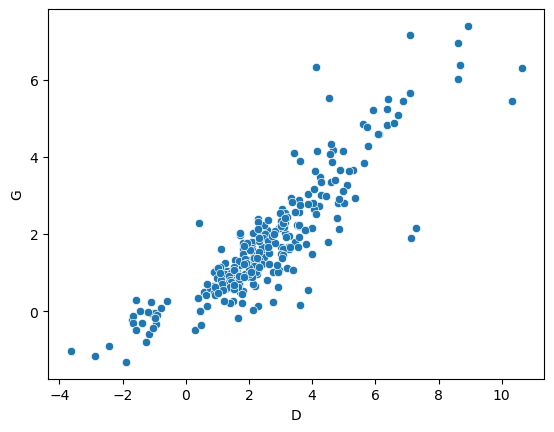

In [36]:
sns.scatterplot(data=t, x='D', y='G')

# Run 1: time vs D0

## manu

In [5]:
celltype='Macrophages'
organism = 'Goldhamster'
time = 'D2'
l2fc_lim = 2
alpha=0.001
cut_x = 0.1  # cutoff for expression

In [4]:
adata = sc.read("/fast/scratch/users/peidlis_c/Pancov19_prepdV2_macros.h5")

In [62]:
df = pd.read_csv(f'deseq2_results_{celltype}_{organism}_{time}.csv', index_col=0)
# annotate significance
df['significant'] = False
df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

In [63]:
# annotate mean expression
df['Dwarf_mean'] = 0
in_vars = df.index[np.isin(df.index, adata.var_names)]
df.loc[in_vars, 'Dwarf_mean'] = np.mean(adata[adata.obs.organism=='Dwarfhamster', in_vars].X.A, axis=0)
df['Gold_mean'] = 0
in_vars = df.index[np.isin(df.index, adata.var_names)]
df.loc[in_vars, 'Gold_mean'] = np.mean(adata[adata.obs.organism=='Goldhamster', in_vars].X.A, axis=0)
df['expressed_in'] = None
df['expressed_in'][df.Dwarf_mean>cut_x] = 'Dwarf'
df['expressed_in'][df.Gold_mean>cut_x] = 'Gold'
df['expressed_in'][(df.Gold_mean>0.01) & (df.Dwarf_mean>0.01)] = 'Both'

In [64]:
# select significant and sufficiently expressed
sdf = df[(df.expressed_in=='Both') & (df.significant)]
print(len(sdf))

74


In [65]:
genes = sdf.index[:30]

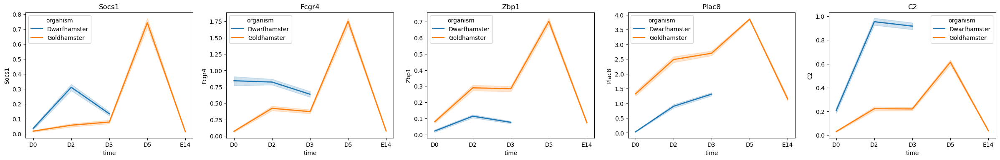

In [66]:
plot_timecourse(adata, genes[:5], x='time', hue='organism', ci=99, markers=True, linewidth=2)

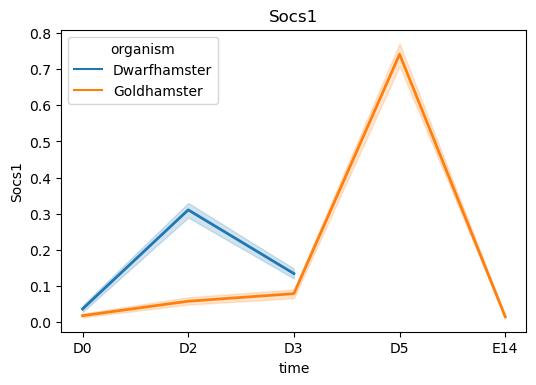

In [67]:
plot_timecourse(adata, genes[0], x='time', hue='organism', ci=99, markers=True, linewidth=2)

In [68]:
gseapy_enrichr(sdf.index, df.index, species='mouse', cutoff=0.01)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,CUSTOM22477148147264,Interferon Gamma Response,38/172,1.364933e-52,3.275838e-51,77.086240,IFIH1;IFIT2;BATF2;RSAD2;NLRC5;CXCL9;IFIT3;MX2;...
1,CUSTOM22477148147264,Interferon Alpha Response,27/84,1.182379e-41,1.418855e-40,86.505319,IFIH1;IFIT2;BATF2;CSF1;RSAD2;IFIT3;UBA7;UBE2L6...
2,CUSTOM22477148147264,Inflammatory Response,14/177,1.323605e-12,1.058884e-11,16.552166,SLC28A2;IL15RA;CXCL10;CSF1;LY6E;CXCL11;IRF7;CX...
3,CUSTOM22477148497728,"Complement Activation, Classical Pathway WP200",4/8,7.228815e-08,2.674662e-06,90.892857,C1QA;C2;C1QB;C1QC
4,CUSTOM22482124999424,Systemic lupus erythematosus,5/25,2.805215e-07,8.043281e-06,36.834783,C2;C1QB;FCGR4;C1QA;C1QC
5,CUSTOM22482124999424,Staphylococcus aureus infection,5/25,2.805215e-07,8.043281e-06,36.834783,C2;C1QB;FCGR4;C1QA;C1QC
6,CUSTOM22482124999424,Influenza A,8/116,3.398570e-07,8.043281e-06,13.183908,IFIH1;MX2;CXCL10;OAS2;RSAD2;IRF7;TNFSF10;CCL5
7,CUSTOM22477148147264,TNF-alpha Signaling via NF-kB,9/189,1.391608e-06,8.349649e-06,9.189744,IFIH1;IL15RA;IFIT2;CXCL10;CSF1;CXCL11;MXD1;CCL...
8,CUSTOM22477148497728,Type II interferon signaling (IFNG) WP1253,5/28,5.119177e-07,9.470478e-06,32.880435,ISG15;IFIT2;CXCL10;SOCS1;CXCL9
9,CUSTOM22477148147264,Complement,8/166,5.114646e-06,2.145896e-05,9.176342,C2;CDA;CCL5;C1QA;S100A9;IRF7;MMP8;C1QC


## auto

In [569]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 50  # gene must have these many counts in all considered cells from all samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered cells from all samples

results = {}
results2 = {}

for celltype in ['Neutrophils']:#['Endothelials', 'Neutrophils', 'Macrophages']: 
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
    for organism in ['Dwarfhamster', 'Goldhamster']:
        times = ['D2', 'D3'] if organism=='Dwarfhamster' else ['D2', 'D3', 'D5', 'E14']
        for time in times:
            ckey = f'{celltype}_{organism}_{time}'
            df = pd.read_csv(f'deseq2_results_{ckey}.csv', index_col=0)
            # annotate significance
            df['significant'] = False
            df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
            
            # annotate expression
            df['expressed'] = False
            df['enough_cells'] = False
            in_vars = df.index[np.isin(df.index, adata.var_names)]
            mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', time]))
            df.loc[in_vars, f'counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
            df.loc[in_vars, f'cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
            df.loc[in_vars, f'pcells'] = 100 * df.loc[in_vars, f'cells'] / np.sum(mask)
            df.loc[df[f'counts'] > min_counts, 'expressed'] = True
            df.loc[df[f'pcells'] > min_pcells, 'enough_cells'] = True 

            # select significant and sufficiently expressed and enough cells
            sdf = df[(df.expressed) & (df.enough_cells) & (df.significant)]
            results[ckey] = annotate_genes(sdf, tab)

            r = gseapy_enrichr(sdf.index, df.index, species='human', cutoff=alpha_gsea)
            results2[ckey] = r
            print(f'{ckey}:\tFound {len(sdf)} filtered DEGs enriched for {0 if r is None else len(r)} gene sets.')


100%|██████████| 474/474 [00:05<00:00, 80.44it/s]


Neutrophils_Dwarfhamster_D2:	Found 474 filtered DEGs enriched for 86 gene sets.


100%|██████████| 248/248 [00:03<00:00, 81.17it/s]


Neutrophils_Dwarfhamster_D3:	Found 248 filtered DEGs enriched for 30 gene sets.


100%|██████████| 95/95 [00:01<00:00, 82.03it/s]


Neutrophils_Goldhamster_D2:	Found 95 filtered DEGs enriched for 111 gene sets.


100%|██████████| 64/64 [00:00<00:00, 81.59it/s]


Neutrophils_Goldhamster_D3:	Found 64 filtered DEGs enriched for 123 gene sets.


100%|██████████| 180/180 [00:02<00:00, 81.60it/s]


Neutrophils_Goldhamster_D5:	Found 180 filtered DEGs enriched for 103 gene sets.


0it [00:00, ?it/s]

No hits found during GOEA.
Neutrophils_Goldhamster_E14:	Found 0 filtered DEGs enriched for 0 gene sets.


In [513]:
writer = pd.ExcelWriter('run1_results.xlsx', engine='xlsxwriter')
for ckey in results.keys():
    ckey_ = ckey.replace('hamster', '')
    results[ckey].to_excel(writer, sheet_name=f'{ckey_}_DEGs')
    if results2[ckey] is not None:
        results2[ckey].to_excel(writer, sheet_name=f'{ckey_}_Enrich')
writer.save()

In [475]:
keys = ['Macrophages_Dwarfhamster_D2', 'Macrophages_Dwarfhamster_D3', 'Macrophages_Goldhamster_D2', 'Macrophages_Goldhamster_D3', 
        'Endothelials_Dwarfhamster_D2', 'Endothelials_Dwarfhamster_D3', 'Endothelials_Goldhamster_D2', 'Endothelials_Goldhamster_D3', 'Endothelials_Goldhamster_E14',
        'Neutrophils_Dwarfhamster_D2', 'Neutrophils_Dwarfhamster_D3', 'Neutrophils_Goldhamster_D2', 'Neutrophils_Goldhamster_D3']
keys = [ckey.replace('hamster', '') for ckey in keys]

In [570]:
celltype='Neutrophils'
df = results['Neutrophils_Goldhamster_D5']

In [571]:
genes_old = list(results['Neutrophils_Dwarfhamster_D2'].index) + list(results['Neutrophils_Dwarfhamster_D3'].index)+ list(results['Neutrophils_Goldhamster_D2'].index)
genes = list(set(df.index) - set(genes_old))
len(genes)

78

In [565]:
key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

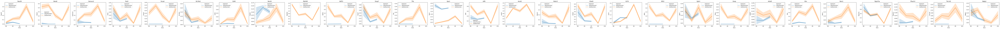

In [574]:
# nice
i=1
plot_timecourse(adata, genes[50*i:50*(i+1)])

## Compare x

In [226]:
l2fc_lim = 1  # gene must have a higher absolute l2fc than this
alpha = 0.01  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered cells from all samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 2  # gene must be found in at least these many cells (in percent) in all considered cells from all samples

In [413]:
results = {}
for celltype in ['Neutrophils', 'Endothelials', 'Macrophages']: 
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
    for ckey in [f'{celltype}_Dwarfhamster_D2', f'{celltype}_Dwarfhamster_D3', f'{celltype}_Goldhamster_D2', f'{celltype}_Goldhamster_D3', f'{celltype}_Goldhamster_D5', f'{celltype}_Goldhamster_E14']:
        df = pd.read_csv(f'deseq2_results_{ckey}.csv', index_col=0)
        # annotate significance
        df['significant'] = False
        df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
        
        _, organism, time = ckey.split('_')

        # annotate expression
        df['expressed'] = False
        df['enough_cells'] = False
        df['extra_significant'] = False
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', time]))
        total_cells = np.sum(mask)
        df.loc[in_vars, 'counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, 'cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, 'pcells'] = 100 * df.loc[in_vars, 'cells'] / total_cells if total_cells is not None else 0
        df.loc[df['counts'] > min_counts, 'expressed'] = True
        df.loc[df['pcells'] > min_pcells, 'enough_cells'] = True 
        df['extra_significant'] = (df.expressed) & (df.enough_cells) & (df.significant)
        results[ckey] = df.copy()
tab = pd.concat(results, axis=1)

In [420]:
def plot_tableau(tab, celltype, key_d, key_g):
    for key in [key_d, key_g]:
        tab[f'{celltype}_{key}', 'annotation'] = '0'
        tab[f'{celltype}_{key}', 'annotation'][tab[f'{celltype}_{key}', 'extra_significant'] & (tab[f'{celltype}_{key}', 'log2FoldChange'] > 0)] = '+'
        tab[f'{celltype}_{key}', 'annotation'][tab[f'{celltype}_{key}', 'extra_significant'] & (tab[f'{celltype}_{key}', 'log2FoldChange'] < 0)] = '-'
    tab['annotation'] = np.sum([tab[f'{celltype}_{key_d}', 'annotation'], tab[f'{celltype}_{key_g}', 'annotation']], axis=0)
    
    # significant score
    alpha_005=-np.log10(0.05)
    alpha_0001=-np.log10(0.001)
    
    cmap = get_cmap('tab10')
    markers = tab.annotation.unique()
    mapping={1:'+', 0: '0', -1:'-'}
    palette = dict(zip(markers, cmap(np.arange(len(markers)))))

    with sns.axes_style('whitegrid'):
        fig, axss = pl.subplots(3,3, figsize=[15,12])
    ax = axss[1,1]
    sns.scatterplot(data=tab[tab.annotation!='00'], x=(f'{celltype}_{key_d}','log2FoldChange'), y=(f'{celltype}_{key_g}','log2FoldChange'), ax=ax,
                    hue='annotation', palette=palette)
    ax.set_xlabel(f'L2FC {key_d}vsD0')
    ax.set_ylabel(f'L2FC {key_g}vsD0')
    ax.set_title('L2FC to D0 across hamsters')
    ax.axvline(0, c='k', zorder=-1)
    ax.axhline(0, c='k', zorder=-1)

    for i in [-1,0,1]:
        for j in [-1,0,1]:
            if i==0 and j==0:
                continue
            else:
                ax = axss[2-(j+1), (i+1)]
                mapping={1:'+', 0: '0', -1:'-'}
                quadrant = mapping[i]+mapping[j]
                genes = list(tab[tab.annotation==quadrant].index)
                gsea_res = gseapy_enrichr(genes, tab.index, min_genes=1, cutoff=1)
                if gsea_res is None:
                    continue
                gsea_res['database'] = [x.split('_')[0] for x in gsea_res.Term]
                gsea_res['Term_'] = [' '.join([y.capitalize() for y in x.split('_', 1)[-1].split('_')]) for x in gsea_res.Term]
                gsea_res['Term_'] = [x if len(x)<30 else x[:30][::-1].replace(' ','\n', 1)[::-1]+x[30:] for x in gsea_res.Term_]
                gsea_res = gsea_res.drop('Gene_set', axis=1)
                gsea_res['score'] = -np.log10(gsea_res['Adjusted P-value'])
                sns.barplot(data=gsea_res[:7], x='score', y='Term_', ax=ax, color=palette[quadrant])
                ax.bar_label(ax.containers[0], gsea_res[:7].Term_)
                ax.set_yticklabels([])
                ax.set_ylabel('')
                ax.axvline(alpha_0001, color='red')
                ax.axvline(alpha_005, color='green')
                ax.set_xticks([alpha_0001, alpha_005])
                ax.set_xticklabels(['α=0.0001', 'α=0.05'])
                ax.set_xlim(0, ax.get_xlim()[1]*3)
                ax.set_xlabel('')
                ax.set_title(f'Pathway Enrichment ({quadrant})')
    pl.suptitle(f'{celltype} DEGs between {key_d}vsD0 and {key_g}vsD0', fontsize=22)
    pl.tight_layout()
#     pdf.savefig(bbox_inches='tight')
#     pl.close()

In [423]:
with PdfPages(f'{figure_path}/run1_cross_tableaus.pdf') as pdf:
    for celltype in tqdm(['Neutrophils', 'Endothelials', 'Macrophages']): 
        for key_d in tqdm(['Dwarfhamster_D2', 'Dwarfhamster_D3'], leave=False):
            for key_g in ['Goldhamster_D2', 'Goldhamster_D3', 'Goldhamster_D5', 'Goldhamster_E14']:
                plot_tableau(tab, celltype, key_d, key_g)
                pdf.savefig(bbox_inches='tight')
                pl.close()

  0%|          | 0/2 [00:00<?, ?it/s]

No hits found during GOEA.



 50%|█████     | 1/2 [00:40<00:40, 40.73s/it]

No hits found during GOEA.
No hits found during GOEA.



  0%|          | 0/2 [00:00<?, ?it/s]

No hits found during GOEA.
No hits found during GOEA.



 50%|█████     | 1/2 [00:38<00:38, 38.98s/it]

No hits found during GOEA.
No hits found during GOEA.



  0%|          | 0/2 [00:00<?, ?it/s]

No hits found during GOEA.



 50%|█████     | 1/2 [00:45<00:45, 45.53s/it]

No hits found during GOEA.



100%|██████████| 3/3 [04:05<00:00, 81.70s/it]


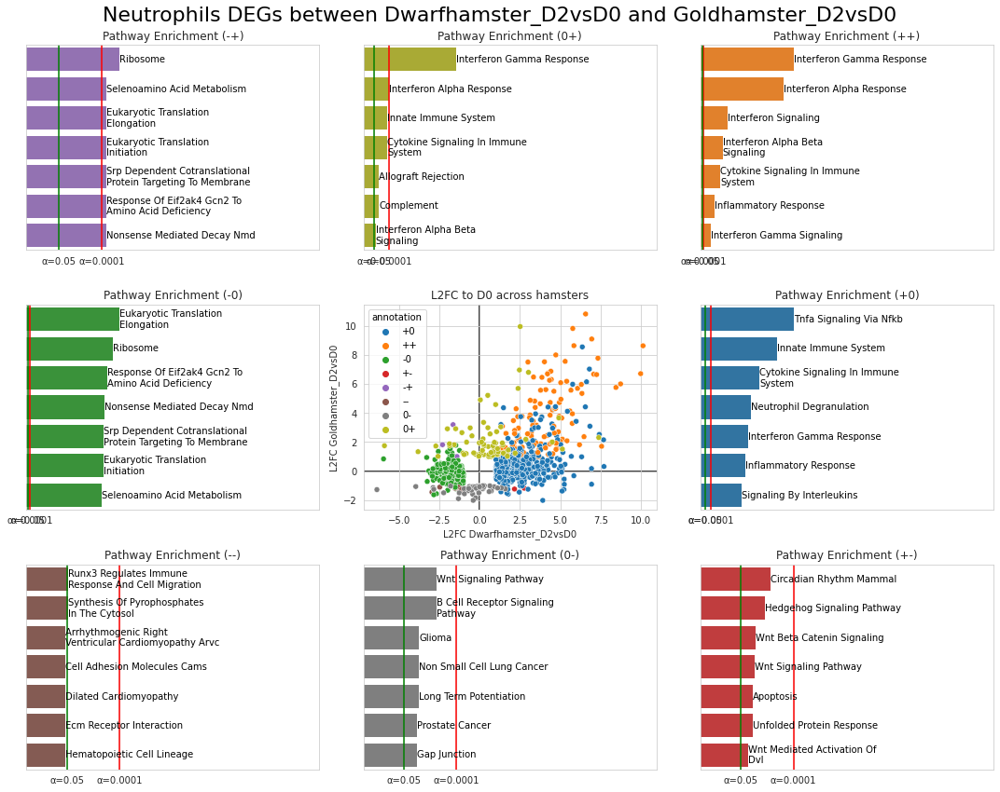

In [422]:
celltype = 'Neutrophils'
key_d = 'Dwarfhamster_D2'
key_g = 'Goldhamster_D2'

plot_tableau(tab, celltype, key_d, key_g)

## Compare Gold and Dwarf run1 Endos

In [225]:
l2fc_lim = 1  # gene must have a higher absolute l2fc than this
alpha = 0.01  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered cells from all samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 2  # gene must be found in at least these many cells (in percent) in all considered cells from all samples

### D2 vs D5

In [337]:
results = {}
for celltype in ['Endothelials']:#, 'Neutrophils', 'Macrophages']: 
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
    for ckey in [f'{celltype}_Dwarfhamster_D2', f'{celltype}_Goldhamster_D5']:
        df = pd.read_csv(f'deseq2_results_{ckey}.csv', index_col=0)
        # annotate significance
        df['significant'] = False
        df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
        
        _, organism, time = ckey.split('_')

        # annotate expression
        df['expressed'] = False
        df['enough_cells'] = False
        df['extra_significant'] = False
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', time]))
        total_cells = np.sum(mask)
        df.loc[in_vars, 'counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, 'cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, 'pcells'] = 100 * df.loc[in_vars, 'cells'] / total_cells if total_cells is not None else 0
        df.loc[df['counts'] > min_counts, 'expressed'] = True
        df.loc[df['pcells'] > min_pcells, 'enough_cells'] = True 
        df['extra_significant'] = (df.expressed) & (df.enough_cells) & (df.significant)
        results[ckey] = df.copy()

# aggregate
D = results[f'{celltype}_Dwarfhamster_D2'].copy()
G = results[f'{celltype}_Goldhamster_D5'].copy()
D.columns=[d+'_dwarf' for d in D.columns]
G.columns=[d+'_gold' for d in G.columns]
tab = pd.concat([G,D], axis=1)

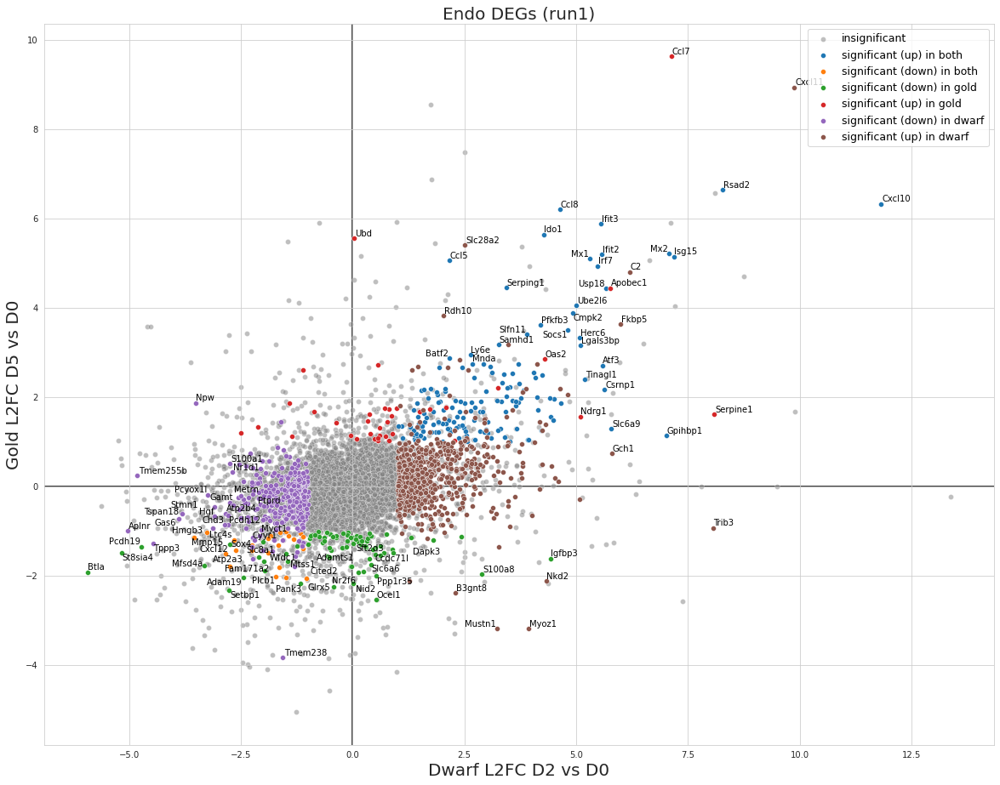

In [283]:
N_top=30
N_top_cross = 5
big_fontsize=20

from adjustText import adjust_text

with sns.axes_style('whitegrid'):
    fig, ax = pl.subplots(figsize=[20,20])
kwargs={'y': 'log2FoldChange_gold', 'x': 'log2FoldChange_dwarf', 'ax': ax}
sns.scatterplot(data=tab[~(tab.extra_significant_gold|tab.extra_significant_dwarf)], label='insignificant', color='grey', zorder=0, alpha=0.5, **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf>0) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf<0) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf<0)], 
                label='significant (down) in dwarf', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf>0)], 
                label='significant (up) in dwarf', **kwargs)

# most regulated and significant
genes_1 = \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=True).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top])
# significant in X, strongly regulated in Y
genes_2 = \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=False).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top_cross])
texts = [pl.text(tab.log2FoldChange_dwarf[gene], tab.log2FoldChange_gold[gene], gene, ha='center', va='center')#, weight='bold' if gene in genes_2 else 'normal') 
         for gene in pd.unique(genes_1+genes_2)]
adjust_text(texts)  # takes multiple minutes...
pl.axvline(0, c='k', zorder=-1)
pl.axhline(0, c='k', zorder=-1)
pl.figaspect(1)
pl.title('Endo DEGs (run1)', fontsize=big_fontsize)
ax.set_aspect('equal')
pl.ylabel('Gold L2FC D5 vs D0', fontsize=big_fontsize)
pl.xlabel('Dwarf L2FC D2 vs D0', fontsize=big_fontsize)
pl.legend(fontsize=(big_fontsize+5)/2)
pl.show()

In [340]:
# up and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf>0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r1 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# down and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf<0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r2 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# up and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold>0)].sort_values('log2FoldChange_gold', ascending=False).index
r3 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)
# down and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold<0)].sort_values('log2FoldChange_gold', ascending=False).index
r4 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)

r = pd.concat({'up dwarf only': r1, 'down dwarf only': r2, 'up gold only': r3,  'down gold only': r4})
r

Gene_set  \
up dwarf only   0  CUSTOM23143380578688   
                1  CUSTOM23143380578688   
                2  CUSTOM23143380578688   
                3  CUSTOM23142796667648   
                4  CUSTOM23142796667648   
                5  CUSTOM23142796667648   
                6  CUSTOM23142796667648   
                7  CUSTOM23143380578688   
                8  CUSTOM23143380578688   
down dwarf only 0  CUSTOM23142766575488   
                1  CUSTOM23140190661312   
                2  CUSTOM23140190661312   
                3  CUSTOM23140190661312   
                4  CUSTOM23140190661312   
up gold only    0  CUSTOM23143142339584   

                                                                Term Overlap  \
up dwarf only   0                          HALLMARK_MTORC1_SIGNALING   37/54   
                1                 HALLMARK_UNFOLDED_PROTEIN_RESPONSE   19/24   
                2                   HALLMARK_PI3K_AKT_MTOR_SIGNALING   17/23   
                3             REACTOME_CELLULAR_RESPONSES_TO_STIMULI  69/123   
                4                      REACTOME_KEAP1_NFE2L2_PATHWAY   25/34   
                5                   REACTOME_INTERLEUKIN_1_SIGNALING   25/35   
                6         REACTOME_NUCLEAR_EVENTS_MEDIATED_BY_NFE2L2   21/28   
                7                         HALLMARK_PROTEIN_SECRETION     8/9   
                8                   HALLMARK_ESTROGEN_RESPONSE_EARLY   20/32   
down dwarf only 0                                      KEGG_RIBOSOME     8/8   
                1         REACTOME_EUKARYOTIC_TRANSLATION_ELONGATION     8/8   
                2               REACTOME_NONSENSE_MEDIATED_DECAY_NMD    9/10   
                3  REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN...    9/10   
                4                       REACTOME_INFLUENZA_INFECTION   11/14   
up gold only    0                 HALLMARK_INTERFERON_GAMMA_RESPONSE  10/118   

                    P-value  Adjusted P-value  Odds Ratio  \
up dwarf only   0  0.000005          0.000225    1.844037   
                1  0.000047          0.001142    2.111728   
                2  0.000513          0.008377    1.971086   
                3  0.000024          0.014301    1.523137   
                4  0.000026          0.014301    1.967544   
                5  0.000060          0.020288    1.911056   
                6  0.000075          0.020288    2.002986   
                7  0.002648          0.032434    2.355558   
                8  0.004320          0.042335    1.668591   
down dwarf only 0  0.000033          0.004789    3.646647   
                1  0.000033          0.020128    3.646647   
                2  0.000069          0.020128    3.302336   
                3  0.000069          0.020128    3.302336   
                4  0.000106          0.023029    2.900059   
up gold only    0  0.001556          0.037341    3.486251   

                                                               Genes  
up dwarf only   0  DDIT4;ADIPOR2;EDEM1;NFIL3;SLC7A5;ACTR3;TRIB3;B...  
                1  DDIT4;EDEM1;SLC7A5;CCL2;CEBPG;NOP56;HSPA9;DNAJ...  
                2  NFKBIB;RIT1;SQSTM1;DUSP3;TNFRSF1A;DDIT3;MYD88;...  
                3  HMGA1;BAG1;EDEM1;PSMA6;PSMD11;UFD1;MAFG;TUBA1C...  
                4  PSMA6;PSMD11;UFD1;MAFG;SESN2;TXNRD1;UBC;SQSTM1...  
                5  MAP2K1;PSMA6;PSMD11;PELI1;NOD2;RELA;UBC;SQSTM1...  
                6  PSMA6;PSMD11;MAFG;TXNRD1;UBC;SQSTM1;GCLC;SRXN1...  
                7        CAV2;NAPG;CD63;GOSR2;BET1;RAB9A;LAMP2;SGMS1  
                8  FLNB;P2RY2;BAG1;PODXL;SLC7A5;MAPT;RRP12;MED13L...  
down dwarf only 0  RPS29;RPL35A;RPS16;RPL12;RPS28;RPL31;RPL23A;RPS19  
                1  RPS29;RPL35A;RPS16;RPL12;RPS28;RPL31;RPL23A;RPS19  
                2  RPS29;RPL35A;RPS16;UPF3A;RPL12;RPS28;RPL31;RPL...  
                3  RPS29;RPL35A;RPS16;RPL12;RPS28;RPL31;SEC61G;RP...  
                4  RPS29;RPL35A;NUP210;RPS16;RPL12;RPS28;RPL31;RP...  
up gold only    0  

### D2 vs D3

In [332]:
results = {}
for celltype in ['Endothelials']:#, 'Neutrophils', 'Macrophages']: 
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
    for ckey in [f'{celltype}_Dwarfhamster_D2', f'{celltype}_Goldhamster_D3']:
        df = pd.read_csv(f'deseq2_results_{ckey}.csv', index_col=0)
        # annotate significance
        df['significant'] = False
        df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
        
        _, organism, time = ckey.split('_')

        # annotate expression
        df['expressed'] = False
        df['enough_cells'] = False
        df['extra_significant'] = False
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', time]))
        total_cells = np.sum(mask)
        df.loc[in_vars, 'counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, 'cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, 'pcells'] = 100 * df.loc[in_vars, 'cells'] / total_cells if total_cells is not None else 0
        df.loc[df['counts'] > min_counts, 'expressed'] = True
        df.loc[df['pcells'] > min_pcells, 'enough_cells'] = True 
        df['extra_significant'] = (df.expressed) & (df.enough_cells) & (df.significant)
        results[ckey] = df.copy()

In [333]:
# aggregate
D = results[f'{celltype}_Dwarfhamster_D2'].copy()
G = results[f'{celltype}_Goldhamster_D3'].copy()
D.columns=[d+'_dwarf' for d in D.columns]
G.columns=[d+'_gold' for d in G.columns]
tab = pd.concat([G,D], axis=1)

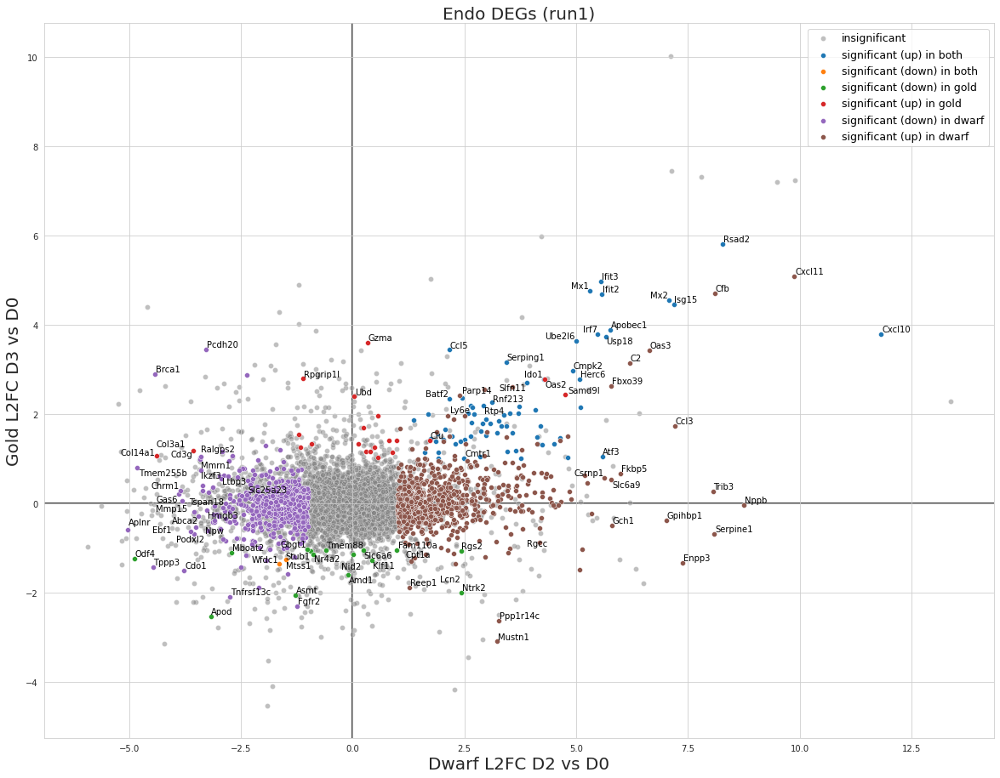

In [297]:
N_top=30
N_top_cross = 5
big_fontsize=20

from adjustText import adjust_text

with sns.axes_style('whitegrid'):
    fig, ax = pl.subplots(figsize=[20,20])
kwargs={'y': 'log2FoldChange_gold', 'x': 'log2FoldChange_dwarf', 'ax': ax}
sns.scatterplot(data=tab[~(tab.extra_significant_gold|tab.extra_significant_dwarf)], label='insignificant', color='grey', zorder=0, alpha=0.5, **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf>0) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf<0) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf<0)], 
                label='significant (down) in dwarf', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf>0)], 
                label='significant (up) in dwarf', **kwargs)

# most regulated and significant
genes_1 = \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=True).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top])
# significant in X, strongly regulated in Y
genes_2 = \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=False).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top_cross])
texts = [pl.text(tab.log2FoldChange_dwarf[gene], tab.log2FoldChange_gold[gene], gene, ha='center', va='center')#, weight='bold' if gene in genes_2 else 'normal') 
         for gene in pd.unique(genes_1+genes_2)]
adjust_text(texts)  # takes multiple minutes...
pl.axvline(0, c='k', zorder=-1)
pl.axhline(0, c='k', zorder=-1)
pl.figaspect(1)
pl.title('Endo DEGs (run1)', fontsize=big_fontsize)
ax.set_aspect('equal')
pl.ylabel('Gold L2FC D3 vs D0', fontsize=big_fontsize)
pl.xlabel('Dwarf L2FC D2 vs D0', fontsize=big_fontsize)
pl.legend(fontsize=(big_fontsize+5)/2)
pl.show()

In [335]:
# up and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf>0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r1 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# down and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf<0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r2 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# up and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold>0)].sort_values('log2FoldChange_gold', ascending=False).index
r3 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)
# down and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold<0)].sort_values('log2FoldChange_gold', ascending=False).index
r4 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)

r = pd.concat({'up dwarf only': r1, 'down dwarf only': r2, 'up gold only': r3,  'down gold only': r4})
r

Gene_set  \
up dwarf only   0  CUSTOM23142796599808   
                1  CUSTOM23142796599808   
                2  CUSTOM23142796599808   
                3  CUSTOM23143120759680   
                4  CUSTOM23143120759680   
                5  CUSTOM23143120759680   
                6  CUSTOM23143120759680   
                7  CUSTOM23142796599808   
                8  CUSTOM23143120759680   
                9  CUSTOM23143120759680   
down dwarf only 0  CUSTOM23142787808384   
up gold only    0  CUSTOM23142778421056   
                1  CUSTOM23142777892224   
                2  CUSTOM23142777899904   
                3  CUSTOM23142777899904   
                4  CUSTOM23142777899904   
                5  CUSTOM23142777899904   
                6  CUSTOM23142777899904   
                7  CUSTOM23142777899904   
                8  CUSTOM23142778421056   
                9  CUSTOM23142778421056   

                                                                Term Overlap  \
up dwarf only   0                   HALLMARK_TNFA_SIGNALING_VIA_NFKB   59/77   
                1                 HALLMARK_UNFOLDED_PROTEIN_RESPONSE   22/24   
                2                          HALLMARK_MTORC1_SIGNALING   41/56   
                3             REACTOME_CELLULAR_RESPONSES_TO_STIMULI  78/117   
                4                   REACTOME_INTERLEUKIN_1_SIGNALING   29/35   
                5                      REACTOME_KEAP1_NFE2L2_PATHWAY   28/33   
                6                 REACTOME_SIGNALING_BY_INTERLEUKINS  70/103   
                7                               HALLMARK_P53_PATHWAY   33/45   
                8         REACTOME_NUCLEAR_EVENTS_MEDIATED_BY_NFE2L2   24/28   
                9                               REACTOME_NEDDYLATION   32/41   
down dwarf only 0                                      KEGG_RIBOSOME     8/8   
up gold only    0                   HALLMARK_CHOLESTEROL_HOMEOSTASIS    4/19   
                1                          KEGG_STEROID_BIOSYNTHESIS     2/2   
                2  REACTOME_ASSEMBLY_OF_COLLAGEN_FIBRILS_AND_OTHE...     3/5   
                3                        REACTOME_COLLAGEN_FORMATION     3/6   
                4  REACTOME_REGULATION_OF_CHOLESTEROL_BIOSYNTHESI...     3/7   
                5                    REACTOME_METABOLISM_OF_STEROIDS    3/11   
                6              REACTOME_COLLAGEN_CHAIN_TRIMERIZATION     2/3   
                7  REACTOME_COLLAGEN_BIOSYNTHESIS_AND_MODIFYING_E...     2/4   
                8                          HALLMARK_MTORC1_SIGNALING    4/56   
                9                                HALLMARK_COMPLEMENT    4/49   

                        P-value  Adjusted P-value  Odds Ratio  \
up dwarf only   0  1.101870e-07          0.000005    1.657802   
                1  6.053224e-06          0.000148    1.951160   
                2  7.243505e-05          0.001183    1.568679   
                3  1.412240e-05          0.004431    1.443566   
                4  1.592607e-05          0.004431    1.769702   
                5  9.088414e-06          0.004431    1.811641   
                6  1.478492e-05          0.004431    1.468735   
                7  3.626597e-04          0.004443    1.566549   
                8  2.990538e-05          0.006657    1.826685   
                9  5.745395e-05          0.010658    1.668190   
down dwarf only 0  1.012496e-04          0.014884    3.173830   
up gold only    0  6.366630e-05          0.001464   21.764835   
                1  1.508679e-04          0.002414   85.512821   
                2  1.691796e-05          0.002752   57.255528   
                3  3.356178e-05          0.002752   48.417879   
                4  5.825729e-05          0.003185   41.936937   
                5  2.658505e-04          0.010900   27.284371   
                6  4.491647e-04          0.014733   61.043956   
                7  8.915069e-04          0.024368   47.450142   
                8  4.44

### D3 vs D5

In [327]:
results = {}
for celltype in ['Endothelials']:#, 'Neutrophils', 'Macrophages']: 
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
    for ckey in [f'{celltype}_Dwarfhamster_D3', f'{celltype}_Goldhamster_D5']:
        df = pd.read_csv(f'deseq2_results_{ckey}.csv', index_col=0)
        # annotate significance
        df['significant'] = False
        df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
        
        _, organism, time = ckey.split('_')

        # annotate expression
        df['expressed'] = False
        df['enough_cells'] = False
        df['extra_significant'] = False
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', time]))
        total_cells = np.sum(mask)
        df.loc[in_vars, 'counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, 'cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, 'pcells'] = 100 * df.loc[in_vars, 'cells'] / total_cells if total_cells is not None else 0
        df.loc[df['counts'] > min_counts, 'expressed'] = True
        df.loc[df['pcells'] > min_pcells, 'enough_cells'] = True 
        df['extra_significant'] = (df.expressed) & (df.enough_cells) & (df.significant)
        results[ckey] = df.copy()

In [328]:
# aggregate
D = results[f'{celltype}_Dwarfhamster_D3'].copy()
G = results[f'{celltype}_Goldhamster_D5'].copy()
D.columns=[d+'_dwarf' for d in D.columns]
G.columns=[d+'_gold' for d in G.columns]
tab = pd.concat([G,D], axis=1)

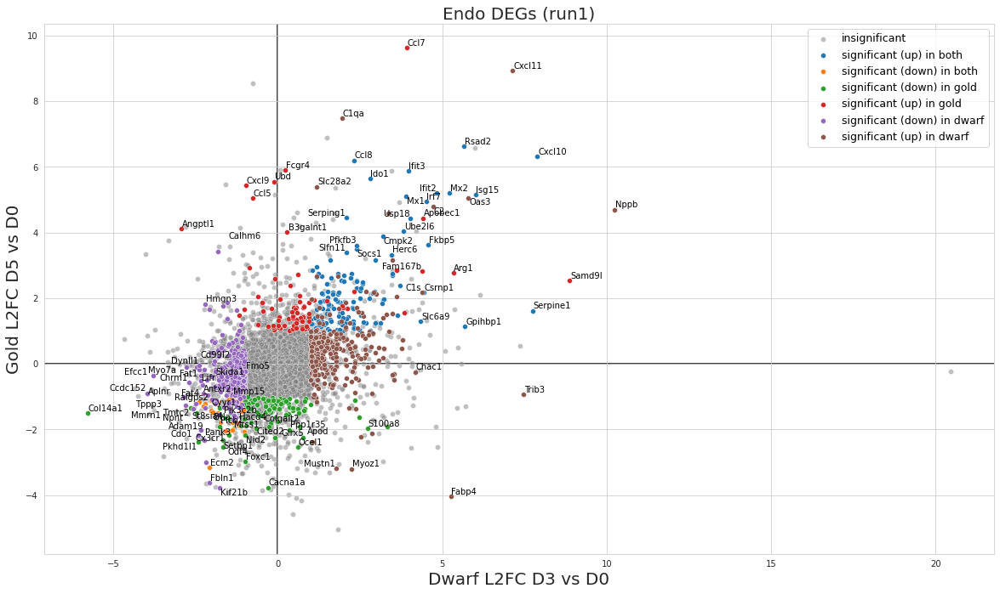

In [290]:
N_top=30
N_top_cross = 5
big_fontsize=20

from adjustText import adjust_text

with sns.axes_style('whitegrid'):
    fig, ax = pl.subplots(figsize=[20,20])
kwargs={'y': 'log2FoldChange_gold', 'x': 'log2FoldChange_dwarf', 'ax': ax}
sns.scatterplot(data=tab[~(tab.extra_significant_gold|tab.extra_significant_dwarf)], label='insignificant', color='grey', zorder=0, alpha=0.5, **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf>0) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & tab.extra_significant_dwarf & (tab.log2FoldChange_dwarf<0) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in both', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold<0)], 
                label='significant (down) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_gold & (~tab.extra_significant_dwarf.astype(bool)) & (tab.log2FoldChange_gold>0)], 
                label='significant (up) in gold', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf<0)], 
                label='significant (down) in dwarf', **kwargs)
sns.scatterplot(data=tab[tab.extra_significant_dwarf & (~tab.extra_significant_gold.astype(bool)) & (tab.log2FoldChange_dwarf>0)], 
                label='significant (up) in dwarf', **kwargs)

# most regulated and significant
genes_1 = \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_gold==True].sort_values('log2FoldChange_gold', ascending=True).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_dwarf==True].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top])
# significant in X, strongly regulated in Y
genes_2 = \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False)].sort_values('log2FoldChange_gold', ascending=False).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top_cross]) + \
list(tab[(tab.extra_significant_dwarf==False) & (tab.extra_significant_gold==True)].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top_cross])
texts = [pl.text(tab.log2FoldChange_dwarf[gene], tab.log2FoldChange_gold[gene], gene, ha='center', va='center')#, weight='bold' if gene in genes_2 else 'normal') 
         for gene in pd.unique(genes_1+genes_2)]
adjust_text(texts)  # takes multiple minutes...
pl.axvline(0, c='k', zorder=-1)
pl.axhline(0, c='k', zorder=-1)
pl.figaspect(1)
pl.title('Endo DEGs (run1)', fontsize=big_fontsize)
ax.set_aspect('equal')
pl.ylabel('Gold L2FC D5 vs D0', fontsize=big_fontsize)
pl.xlabel('Dwarf L2FC D3 vs D0', fontsize=big_fontsize)
pl.legend(fontsize=(big_fontsize+5)/2)
pl.show()

In [330]:
# up and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf>0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r1 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# down and significant in dwarf, insignificant in gold
genes = tab[(tab.extra_significant_dwarf==True) & (tab.extra_significant_gold==False) & (tab.log2FoldChange_dwarf<0)].sort_values('log2FoldChange_dwarf', ascending=False).index
r2 = gseapy_enrichr(genes, background=tab[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)].index, cutoff=0.05).head(10)
# up and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold>0)].sort_values('log2FoldChange_gold', ascending=False).index
r3 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)
# down and significant in gold, insignificant in dwarf
genes = tab[(tab.extra_significant_gold==True) & (tab.extra_significant_dwarf==False) & (tab.log2FoldChange_gold<0)].sort_values('log2FoldChange_gold', ascending=False).index
r4 = gseapy_enrichr(genes, background=tab.index[(tab.extra_significant_dwarf==True) | (tab.extra_significant_gold==True)], cutoff=0.05).head(10)

r = pd.concat({'up dwarf only': r1, 'down dwarf only': r2, 'up gold only': r3,  'down gold only': r4})
r

Gene_set  \
up dwarf only 0  CUSTOM23143121144128   
              1  CUSTOM23143126382976   
              2  CUSTOM23143126382976   
              3  CUSTOM23143126382976   
              4  CUSTOM23143126382976   
              5  CUSTOM23143126382976   
              6  CUSTOM23143126382976   
              7  CUSTOM23143126382976   
              8  CUSTOM23143126382976   
              9  CUSTOM23143121144128   
up gold only  0  CUSTOM23143102270208   
              1  CUSTOM23143102270208   
              2  CUSTOM23143102270208   
              3  CUSTOM23143102270208   

                                                              Term Overlap  \
up dwarf only 0                          HALLMARK_MTORC1_SIGNALING   33/47   
              1             REACTOME_CELLULAR_RESPONSES_TO_STIMULI   53/90   
              2         REACTOME_NUCLEAR_EVENTS_MEDIATED_BY_NFE2L2   22/29   
              3                      REACTOME_KEAP1_NFE2L2_PATHWAY   23/32   
              4      REACTOME_CELLULAR_RESPONSE_TO_CHEMICAL_STRESS   25/38   
              5   REACTOME_DISORDERS_OF_TRANSMEMBRANE_TRANSPORTERS   18/26   
              6  REACTOME_THE_ROLE_OF_GTSE1_IN_G2_M_PROGRESSION...   18/26   
              7            REACTOME_MITOTIC_METAPHASE_AND_ANAPHASE   19/28   
              8           REACTOME_SEPARATION_OF_SISTER_CHROMATIDS   19/28   
              9                              HALLMARK_ADIPOGENESIS   15/22   
up gold only  0                 HALLMARK_INTERFERON_GAMMA_RESPONSE   19/98   
              1                   HALLMARK_IL6_JAK_STAT3_SIGNALING    7/23   
              2                       HALLMARK_ALLOGRAFT_REJECTION    8/38   
              3                 HALLMARK_INTERFERON_ALPHA_RESPONSE   11/69   

                      P-value  Adjusted P-value  Odds Ratio  \
up dwarf only 0  3.985618e-09      1.952953e-07    2.545369   
              1  1.183411e-09      9.337114e-07    2.191353   
              2  2.107047e-07      8.312300e-05    2.702477   
              3  5.684684e-07      1.495072e-04    2.563236   
              4  2.460518e-06      4.853371e-04    2.350132   
              5  2.464844e-05      2.430953e-03    2.450199   
              6  2.464844e-05      2.430953e-03    2.450199   
              7  2.249964e-05      2.430953e-03    2.404511   
              8  2.249964e-05      2.430953e-03    2.404511   
              9  1.626981e-04      3.986104e-03    2.404458   
up gold only  0  7.821941e-06      2.111924e-04    3.536090   
              1  4.724019e-04      6.377425e-03    5.095528   
              2  2.656975e-03      2.391277e-02    3.527900   
              3  4.503137e-03      3.039617e-02    2.684385   

                                                             Genes  
up dwarf only 0  DDIT4;ADIPOR2;EDEM1;PSMD14;PSMC2;NFIL3;SLC7A5;...  
              1  HMGA1;BAG1;EDEM1;PSMD14;PSMA6;PSMD11;PSMC2;MAF...  
              2  PSMD14;PSMA6;PSMD11;PSMC2;MAFG;PSMD2;UBC;SQSTM...  
              3  PSMD14;PSMA6;PSMD11;PSMC2;MAFG;SESN2;PSMD2;UBC...  
              4  PSMD14;PSMA6;PSMD11;PSMC2;MAFG;SESN2;PSMD2;UBC...  
              5  UBC;SLC3A2;PSMD14;PSMA6;PSMD11;PSMC2;PSMD7;SLC...  
              6  UBC;TUBB4B;PSMD14;PSMA6;PSMD11;PSMC2;PSMD7;TUB...  
              7  PSMD14;PSMA6;PSMD11;PSMC2;TUBA1C;PSMD2;UBC;TUB...  
              8  PSMD14;PSMA6;PSMD11;PSMC2;TUBA1C;PSMD2;UBC;TUB...  
              9  ADIPOR2;UBC;ALDOA;UCP2;FABP4;ARL4A;ANGPTL4;ALD...  
up gold only  0  EPSTI1;PSME1;SP110;SAMD9L;PSMB10;FAS;CCL7;CCL5...  
              1           BAK1;CXCL9;TNFRSF12A;IRF1;FAS;CCL7;STAT1  
              2       CXCL9;RARS1;PSMB10;FAS;CCL7;RIPK2;STAT1;CCL5  
              3  EPSTI1;RNF31;PSME1;SP110;IRF1;IFI30;SAMD9L;PSM...

# Run 2: No interaction orga differences

Obviously this spits out out genes that are only expression in one of the organisms. I need to filter.

## manu

In [29]:
celltype='Macrophages'
l2fc_lim = 2
alpha=0.001
cut_x = 0.1  # cutoff for expression

In [30]:
key = '_endos' if celltype=='Endothelials' else 'V2_macros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

In [31]:
df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf.csv', index_col=0)
# annotate significance
df['significant'] = False
df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

In [32]:
# annotate expression
df['Dwarf_mean'] = 0
in_vars = df.index[np.isin(df.index, adata.var_names)]
df.loc[in_vars, 'Dwarf_mean'] = np.mean(adata[adata.obs.organism=='Dwarfhamster', in_vars].X.A, axis=0)
df['Gold_mean'] = 0
in_vars = df.index[np.isin(df.index, adata.var_names)]
df.loc[in_vars, 'Gold_mean'] = np.mean(adata[adata.obs.organism=='Goldhamster', in_vars].X.A, axis=0)
df['expressed_in'] = None
df['expressed_in'][df.Dwarf_mean>cut_x] = 'Dwarf'
df['expressed_in'][df.Gold_mean>cut_x] = 'Gold'
df['expressed_in'][(df.Gold_mean>0.01) & (df.Dwarf_mean>0.01)] = 'Both'

In [33]:
# select significant and sufficiently expressed
sdf = df[(df.expressed_in=='Both') & (df.significant)]
print(len(sdf))

558


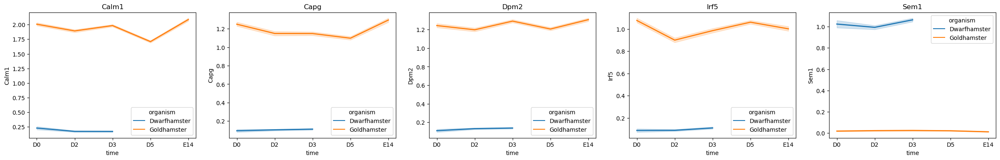

In [34]:
plot_timecourse(adata, sdf.index[:5], x='time', hue='organism', ci=99, markers=True, linewidth=2)

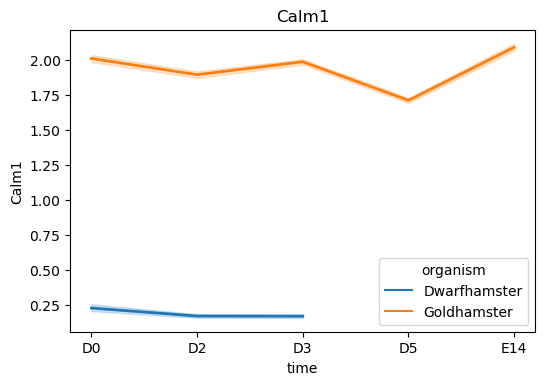

In [35]:
plot_timecourse(adata, sdf.index[0], x='time', hue='organism', ci=99, markers=True, linewidth=2)

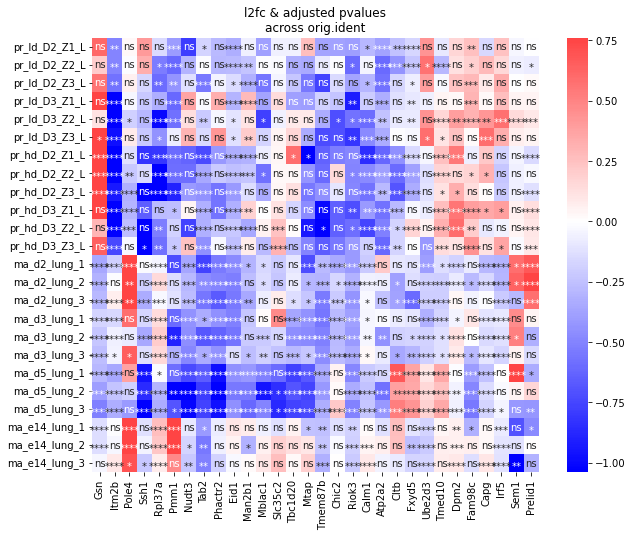

In [36]:
genes = sdf.index[:30]
pl.figure(figsize=[10,8])
plot_differential_test(adata, genes, 'orig.ident', control=control_dict, sort_groups=False, cluster='col')#, vmin=-2, vmax=2

In [37]:
gseapy_enrichr(sdf.index, df.index, species='mouse', cutoff=0.01)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,CUSTOM22513464284544,Interferon Gamma Response,23/188,9.671345e-07,0.000045,3.266375,MT2A;NLRC5;FAS;IFITM2;VAMP5;BST2;MX2;PSMB10;PT...
1,CUSTOM22513464284544,Coagulation,16/112,5.935196e-06,0.000114,3.784924,GSN;MMP8;C3;F12;APOC1;C2;TIMP1;C1QA;CTSH;FURIN...
2,CUSTOM22513464284544,Inflammatory Response,21/182,7.263595e-06,0.000114,3.070477,FPR1;OLR1;BST2;CSF1;MARCO;SEMA4D;ADGRE1;IFITM1...
3,CUSTOM22513464284544,KRAS Signaling Up,19/166,2.204516e-05,0.000259,3.037910,ADAM17;ADAM8;FCER1G;LAT2;TSPAN13;EMP1;GALNT3;R...
4,CUSTOM22513464284544,Complement,19/171,3.346967e-05,0.000315,2.948052,OLR1;FCER1G;GNB4;CPM;MMP8;APOC1;TIMP1;CTSH;S10...
5,CUSTOM22513416604160,Staphylococcus aureus infection,9/38,1.057431e-05,0.001412,6.226920,FCGR4;C2;C3;C1QA;CAMP;FPR2;C1QB;CFB;FPR1
6,CUSTOM22513416604160,Systemic lupus erythematosus,9/37,8.352639e-06,0.001412,6.395658,SNRPD3;C2;C3;C1QA;TNF;ACTN1;C1QB;FCGR4;ELANE
7,CUSTOM22513416604160,Pertussis,11/64,2.946627e-05,0.002622,4.527194,CALM3;CALM1;C3;C2;C1QA;MAPK1;CFL2;TNF;CALM2;TI...
8,CUSTOM22513464284544,Adipogenesis,18/197,6.240621e-04,0.004888,2.415398,IMMT;MTCH2;PPM1B;C3;RIOK3;SQOR;RETN;CD36;APOE;...
9,CUSTOM22513464284544,Interferon Alpha Response,11/95,1.054931e-03,0.007083,3.043337,IFITM1;IFITM2;BST2;CSF1;SAMD9L;ISG20;UBA7;SELL...


## auto

In [534]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 50  # gene must have these many counts in all considered samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered samples

results = {}
results2 = {}

for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

    df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf.csv', index_col=0)
    # annotate significance
    df['significant'] = False
    df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

    # annotate expression
    df['expressed_in'] = None
    df['enough_cells_in'] = None
    for organism in ['Dwarfhamster', 'Goldhamster']:
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose')
        df.loc[in_vars, f'{organism}_counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, f'{organism}_cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, f'{organism}_pcells'] = 100 * df.loc[in_vars, f'{organism}_cells'] / np.sum(mask)
        df.loc[df[f'{organism}_counts'] > min_counts, 'expressed_in'] = organism
        df.loc[df[f'{organism}_pcells'] > min_pcells, 'enough_cells_in'] = organism
    
    df['expressed_in'][(df.Goldhamster_counts>min_counts) & (df.Dwarfhamster_counts>min_counts)] = 'Both' 
    df['enough_cells_in'][(df.Goldhamster_pcells>min_pcells) & (df.Dwarfhamster_pcells>min_pcells)] = 'Both' 

    # select significant and sufficiently expressed and enough cells
    sdf = df[(df.expressed_in=='Both') & (df.enough_cells_in=='Both') & (df.significant)]
    results[celltype] = annotate_genes(sdf, tab)
    
    r = gseapy_enrichr(sdf.index, df.index, species='human', cutoff=alpha_gsea)
    results2[celltype] = r
    
    print(f'{celltype}:\tFound {len(sdf)} filtered DEGs enriched for {len(r)} gene sets.')

100%|██████████| 432/432 [00:05<00:00, 77.90it/s]


Macrophages:	Found 432 filtered DEGs enriched for 12 gene sets.


100%|██████████| 233/233 [00:02<00:00, 77.89it/s]


Endothelials:	Found 233 filtered DEGs enriched for 30 gene sets.


100%|██████████| 173/173 [00:02<00:00, 81.76it/s]


Neutrophils:	Found 173 filtered DEGs enriched for 46 gene sets.


In [535]:
celltype='Neutrophils'
df = results[celltype]

In [536]:
key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

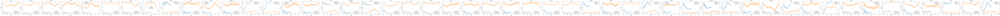

In [537]:
# nice
i=0
plot_timecourse(adata, df.index[50*i:50*(i+1)])

In [9]:
writer = pd.ExcelWriter('run2_results.xlsx', engine='xlsxwriter')
for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    results[celltype].to_excel(writer, sheet_name=f'{celltype}_DEGs')
    results2[celltype].to_excel(writer, sheet_name=f'{celltype}_Enrich')
writer.save()

In [117]:
pd.read_excel('run2_results.xlsx', index_col=0, sheet_name=f'Neutrophils_DEGs')

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,significant,expressed_in,enough_cells_in,Dwarfhamster_counts,Dwarfhamster_cells,Dwarfhamster_pcells,Goldhamster_counts,Goldhamster_cells,Goldhamster_pcells
Calm1,291.909916,4.310226,0.148113,790.123145,7.576764e-174,7.896591e-172,True,Both,Both,390,358,9.357031,6697,3036,69.346734
Ube2d3,371.884892,5.547216,0.187661,775.018401,1.457532e-170,1.449375e-168,True,Both,Both,256,237,6.194459,10998,3815,87.140247
Hsbp1,572.542657,3.105109,0.109235,734.930327,7.588137e-162,6.632889e-160,True,Both,Both,1857,1353,35.363304,12170,3699,84.490635
Cisd2,151.144760,4.462743,0.175605,652.790586,5.523517e-144,3.813338e-142,True,Both,Both,221,206,5.384213,3754,2352,53.723161
Ttc32,235.716085,4.567823,0.180404,592.743849,6.339946e-131,3.734711e-129,True,Both,Both,311,276,7.213800,5363,1943,44.380996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Plin2,105.013191,-2.510528,0.447302,22.614761,1.979579e-06,5.724828e-06,True,Both,Both,3794,2086,54.521694,467,360,8.222933
Socs1,78.983158,-2.061975,0.404646,21.656284,3.261398e-06,9.179511e-06,True,Both,Both,2467,1143,29.874543,1041,488,11.146642
Il1r2,131.024843,-3.190090,0.555695,20.402046,6.276267e-06,1.703266e-05,True,Both,Both,5489,1852,48.405646,791,270,6.167200
Peli1,112.020597,-2.026033,0.402468,19.321356,1.104639e-05,2.919576e-05,True,Both,Both,3191,1640,42.864611,373,346,7.903152


# Run 3: Interaction model (t*o vs t+o)

## manu

In [458]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered samples

results = {}
results2 = {}

for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

    df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf_interaction.csv', index_col=0)
    # annotate significance
    df['significant'] = False
    df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

    # annotate expression
    df['expressed_in'] = None
    df['enough_cells_in'] = None
    for organism in ['Dwarfhamster', 'Goldhamster']:
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', 'D2', 'D3', 'D5']))
        df.loc[in_vars, f'{organism}_counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, f'{organism}_cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, f'{organism}_pcells'] = 100 * df.loc[in_vars, f'{organism}_cells'] / np.sum(mask)
        df.loc[df[f'{organism}_counts'] > min_counts, 'expressed_in'] = organism
        df.loc[df[f'{organism}_pcells'] > min_pcells, 'enough_cells_in'] = organism
    
    df['expressed_in'][(df.Goldhamster_counts>min_counts) & (df.Dwarfhamster_counts>min_counts)] = 'Both' 
    df['enough_cells_in'][(df.Goldhamster_pcells>min_pcells) & (df.Dwarfhamster_pcells>min_pcells)] = 'Both' 

    # select significant and sufficiently expressed and enough cells
    sdf = df[(df.expressed_in=='Both') & (df.enough_cells_in=='Both') & (df.significant)]
    results[celltype] = annotate_genes(sdf, tab)
    
    r = gseapy_enrichr(sdf.index, df.index, species='human', cutoff=alpha_gsea)
    results2[celltype] = r
    
    print(f'{celltype}:\tFound {len(sdf)} filtered DEGs enriched for {len(r)} gene sets.')

100%|██████████| 132/132 [00:01<00:00, 77.38it/s]


Macrophages:	Found 132 filtered DEGs enriched for 35 gene sets.


100%|██████████| 60/60 [00:00<00:00, 76.63it/s]


Endothelials:	Found 60 filtered DEGs enriched for 2 gene sets.


100%|██████████| 77/77 [00:00<00:00, 77.27it/s]


Neutrophils:	Found 77 filtered DEGs enriched for 45 gene sets.


In [459]:
celltype='Endothelials'
df = results[celltype]

In [460]:
key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

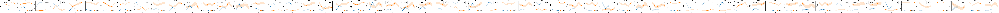

In [461]:
# nice
plot_timecourse(adata, df.index)

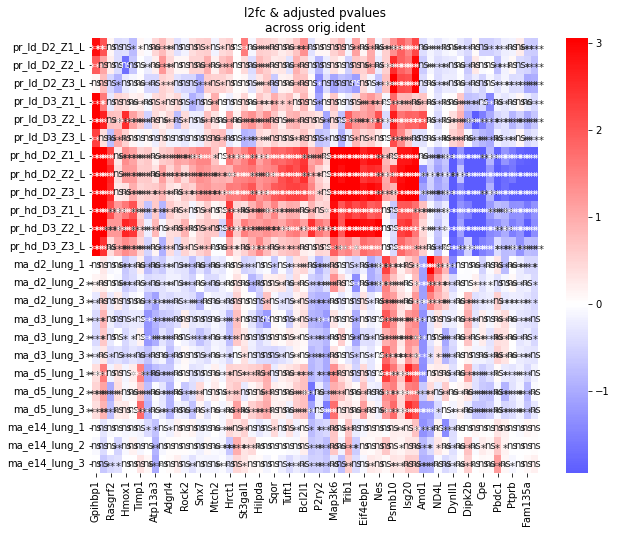

In [462]:
pl.figure(figsize=[10,8])
plot_differential_test(adata, df.index, 'orig.ident', control=control_dict, sort_groups=False, cluster='col')#, vmin=-2, vmax=2

## auto

In [526]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered samples

results = {}
results2 = {}

for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

    df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf_interaction.csv', index_col=0)
    # annotate significance
    df['significant'] = False
    df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

    # annotate expression
    df['expressed_in'] = None
    df['enough_cells_in'] = None
    for organism in ['Dwarfhamster', 'Goldhamster']:
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose')
        df.loc[in_vars, f'{organism}_counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, f'{organism}_cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, f'{organism}_pcells'] = 100 * df.loc[in_vars, f'{organism}_cells'] / np.sum(mask)
        df.loc[df[f'{organism}_counts'] > min_counts, 'expressed_in'] = organism
        df.loc[df[f'{organism}_pcells'] > min_pcells, 'enough_cells_in'] = organism
    
    df['expressed_in'][(df.Goldhamster_counts>min_counts) & (df.Dwarfhamster_counts>min_counts)] = 'Both' 
    df['enough_cells_in'][(df.Goldhamster_pcells>min_pcells) & (df.Dwarfhamster_pcells>min_pcells)] = 'Both' 

    # select significant and sufficiently expressed and enough cells
    sdf = df[(df.expressed_in=='Both') & (df.enough_cells_in=='Both') & (df.significant)]
    results[celltype] = annotate_genes(sdf, tab)
    
    r = gseapy_enrichr(sdf.index, df.index, species='human', cutoff=alpha_gsea)
    results2[celltype] = r
    
    print(f'{celltype}:\tFound {len(sdf)} filtered DEGs enriched for {len(r)} gene sets.')

100%|██████████| 133/133 [00:01<00:00, 78.67it/s]


Macrophages:	Found 133 filtered DEGs enriched for 35 gene sets.


100%|██████████| 60/60 [00:00<00:00, 77.46it/s]


Endothelials:	Found 60 filtered DEGs enriched for 2 gene sets.


100%|██████████| 77/77 [00:00<00:00, 79.40it/s]


Neutrophils:	Found 77 filtered DEGs enriched for 45 gene sets.


In [11]:
writer = pd.ExcelWriter('run3_results.xlsx', engine='xlsxwriter')
for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    results[celltype].to_excel(writer, sheet_name=f'{celltype}_DEGs')
    results2[celltype].to_excel(writer, sheet_name=f'{celltype}_Enrich')
writer.save()

In [527]:
genes = results['Neutrophils'].index

In [528]:
df = extract_df(adata, ['orig.ident'] + list(genes))
mdf = df.groupby('orig.ident').mean()

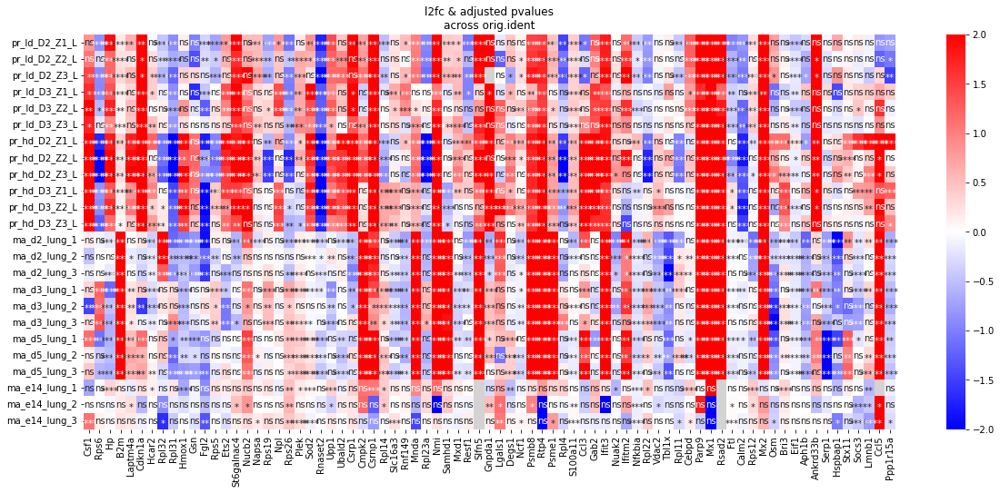

In [530]:
pl.figure(figsize=[20,8])
plot_differential_test(adata, genes, 'orig.ident', control=control_dict, sort_groups=False, vmax=2, vmin=-2)

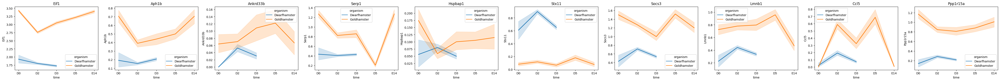

In [533]:
plot_timecourse(adata, genes[-10:], 'time')

In [532]:
results2['Neutrophils']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,members
0,CUSTOM22869195258944,HALLMARK_INTERFERON_GAMMA_RESPONSE,19/183,1.681331e-17,6.052792e-16,19.414169,SOD2;IFIT3;MX2;B2M;RTP4;SOCS3;CMPK2;FGL2;CDKN1...,19
1,CUSTOM22869128746368,KEGG_RIBOSOME,12/82,3.655910e-13,2.156987e-11,24.956049,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12
2,CUSTOM22869195258944,HALLMARK_INTERFERON_ALPHA_RESPONSE,12/95,2.243682e-12,4.038627e-11,21.532912,PSME1;IFITM2;IFIT3;NMI;PSMB8;RTP4;MX1;PARP9;CM...,12
3,CUSTOM22869195258368,REACTOME_EUKARYOTIC_TRANSLATION_ELONGATION,12/86,6.598773e-13,2.415151e-10,23.793187,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12
4,CUSTOM22869195258368,REACTOME_RESPONSE_OF_EIF2AK4_GCN2_TO_AMINO_ACI...,12/95,2.243682e-12,2.737292e-10,21.532912,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12
5,CUSTOM22869195258368,REACTOME_REGULATION_OF_EXPRESSION_OF_SLITS_AND...,14/149,1.786199e-12,2.737292e-10,16.376030,PSME1;RPS6;RPL23A;RPL22;RPS26;RPS12;RPS19;RPL4...,14
6,CUSTOM22869195258368,REACTOME_CELLULAR_RESPONSES_TO_STIMULI,24/631,4.143493e-12,3.791296e-10,7.425363,RPS6;SOD2;RPL22;RPS19;TBL1X;HMOX1;LMNB1;SERP1;...,24
7,CUSTOM22869195258368,REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN...,12/105,7.577572e-12,4.622319e-10,19.473789,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12
8,CUSTOM22869195258368,REACTOME_SELENOAMINO_ACID_METABOLISM,12/104,6.749034e-12,4.622319e-10,19.661967,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12
9,CUSTOM22869195258368,REACTOME_NONSENSE_MEDIATED_DECAY_NMD,12/108,1.064796e-11,5.567361e-10,18.930066,RPL23A;RPS6;RPL22;RPS26;RPS12;RPS19;RPL4;RPL31...,12


## Compare plot (this does not work with run 2 and 3!

In [215]:
l2fc_lim = 1  # gene must have a higher absolute l2fc than this
alpha = 0.01  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered cells from all samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered cells from all samples

In [220]:
results = {}

for celltype in ['Endothelials']:#['Macrophages', 'Endothelials', 'Neutrophils']:
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

    df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf_interaction.csv', index_col=0)
    # annotate significance
    df['significant'] = False
    df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

    # annotate expression
    df['expressed_in'] = None
    df['enough_cells_in'] = None
    df['extra_significant_in'] = None
    for organism in ['Dwarfhamster', 'Goldhamster']:
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose')
        total_cells = np.sum(mask)
        df.loc[in_vars, f'{organism}_counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, f'{organism}_cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, f'{organism}_pcells'] = 100 * df.loc[in_vars, f'{organism}_cells'] / total_cells if total_cells is not None else 0
        df.loc[df[f'{organism}_counts'] > min_counts, 'expressed_in'] = organism
        df.loc[df[f'{organism}_pcells'] > min_pcells, 'enough_cells_in'] = organism
        df.loc[(df[f'{organism}_counts'] > min_counts) & (df[f'{organism}_pcells'] > min_pcells) & (df.significant), 'extra_significant_in'] = organism
    
    df['extra_significant_in'][(df[f'Goldhamster_counts'] > min_counts) & (df[f'Goldhamster_pcells'] > min_pcells) & \
                               (df[f'Dwarfhamster_counts'] > min_counts) & (df[f'Dwarfhamster_pcells'] > min_pcells) & \
                               (df.significant)] = 'Both'
    df['expressed_in'][(df.Goldhamster_counts>min_counts) & (df.Dwarfhamster_counts>min_counts)] = 'Both' 
    df['enough_cells_in'][(df.Goldhamster_pcells>min_pcells) & (df.Dwarfhamster_pcells>min_pcells)] = 'Both'
    
    df['extra_significant_in'] = None
    
    results[celltype] = df # annotate_genes(df, tab)

In [221]:
# aggregate
tab = results[celltype]

<AxesSubplot:xlabel='log2FoldChange', ylabel='score'>

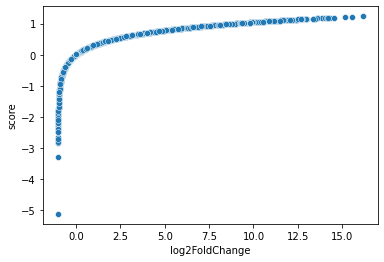

In [226]:
tab['score'] = np.log10(tab.log2FoldChange+1)
sns.scatterplot(data=tab, x='log2FoldChange', y='score')

In [224]:
tab

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,significant,expressed_in,enough_cells_in,extra_significant_in,Dwarfhamster_counts,Dwarfhamster_cells,Dwarfhamster_pcells,Goldhamster_counts,Goldhamster_cells,Goldhamster_pcells
Pla1a,517.788725,1.794004,0.230273,146.484165,1.553702e-32,1.788000e-28,True,Both,Both,None,9084.0,2656.0,51.783973,5261.0,2868.0,44.672897
Gpihbp1,1468.067113,7.731896,0.441597,142.365398,1.218279e-31,7.009976e-28,True,Both,Both,None,8827.0,2004.0,39.071944,35148.0,5511.0,85.841121
Ifngr1,487.866585,0.761161,0.113576,140.003380,3.968736e-31,1.522407e-27,False,Both,Both,None,6960.0,3129.0,61.006044,5742.0,3239.0,50.451713
Lgals9,1166.235808,3.496757,0.207454,137.709707,1.249445e-30,3.594653e-27,True,Both,Both,None,10224.0,3463.0,67.518035,21022.0,5170.0,80.529595
Ehd1,354.454397,-0.189528,0.141689,132.229354,1.935355e-29,4.454413e-26,False,Both,Both,None,6991.0,3017.0,58.822383,2181.0,1674.0,26.074766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mpz,6.040841,13.372421,3.639703,1.752790,NaN,NaN,False,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
Peg3,3.639057,-0.591537,1.426198,3.839117,NaN,NaN,False,Both,None,None,70.0,30.0,0.584909,52.0,44.0,0.685358
SCoV2_N,39.644783,0.022920,2.597340,4.838401,NaN,NaN,False,Both,None,None,114.0,34.0,0.662897,490.0,108.0,1.682243
SCoV2_S,11.737906,0.022875,2.854403,4.902255,NaN,NaN,False,Both,None,None,175.0,22.0,0.428934,66.0,17.0,0.264798


ValueError: Could not interpret value `log2FoldChange_gold` for parameter `x`

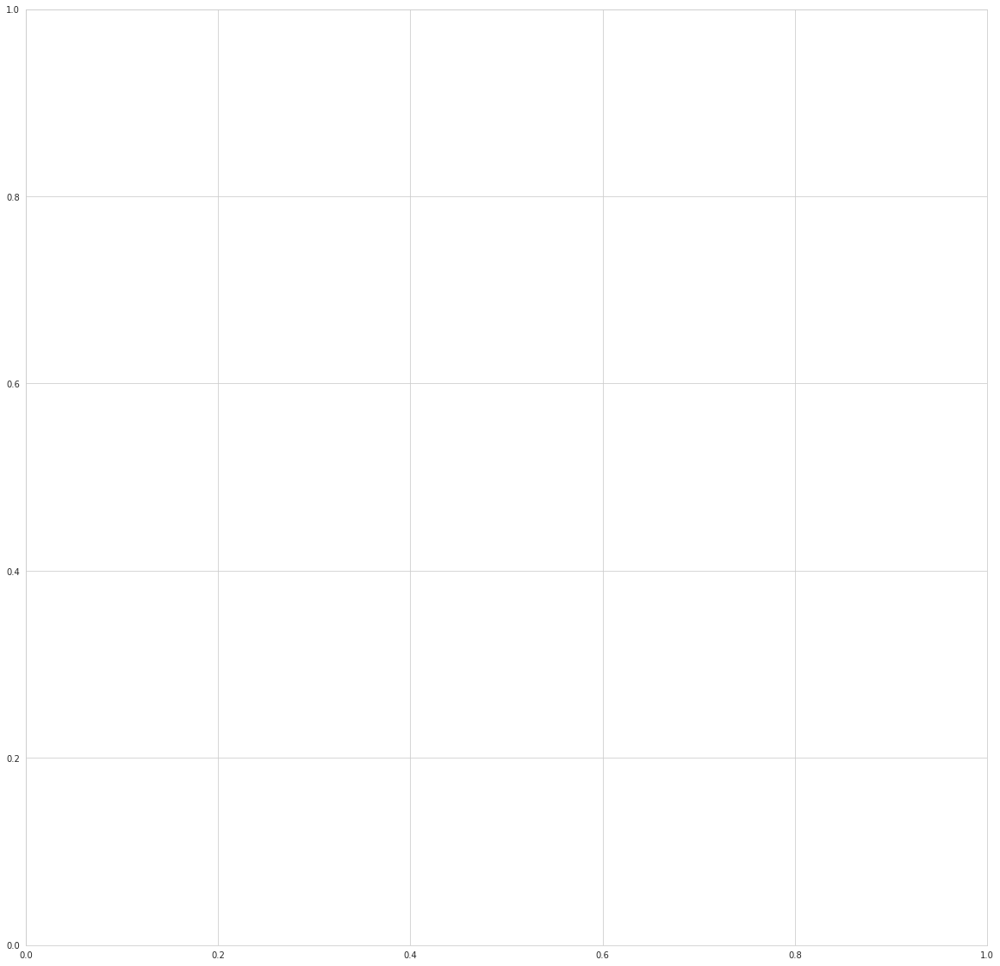

In [223]:
N_top=50

from adjustText import adjust_text

with sns.axes_style('whitegrid'):
    fig, ax = pl.subplots(figsize=[20,20])
kwargs={'x': 'log2FoldChange_gold', 'y': 'log2FoldChange_dwarf', 'ax': ax}
sns.scatterplot(data=tab[pd.isna(tab.extra_significant_in)], label='insignificant', color='grey', zorder=0, alpha=0.5, **kwargs)
sns.scatterplot(data=tab[(tab.extra_significant_in=='Both')], label='significant in both', **kwargs)
sns.scatterplot(data=tab[(tab.extra_significant_in=='Goldhamster')], label='significant in gold', **kwargs)
sns.scatterplot(data=tab[(tab.extra_significant_in=='Dwarfhamster')], label='significant in dwarf', **kwargs)

genes = list(tab[tab.extra_significant_in=='Goldhamster'].sort_values('log2FoldChange_gold', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_in=='Goldhamster'].sort_values('log2FoldChange_gold', ascending=True).index[:N_top]) + \
list(tab[tab.extra_significant_in=='Dwarfhamster'].sort_values('log2FoldChange_dwarf', ascending=False).index[:N_top]) + \
list(tab[tab.extra_significant_in=='Dwarfhamster'].sort_values('log2FoldChange_dwarf', ascending=True).index[:N_top])
texts = [pl.text(tab.log2FoldChange_gold[gene],tab.log2FoldChange_dwarf[gene], gene, ha='center', va='center') for gene in pd.unique(genes)]
# adjust_text(texts)
pl.axvline(0, c='k', zorder=-1)
pl.axhline(0, c='k', zorder=-1)
pl.title('Endo DEGs (run1)')
pl.ylabel('Gold L2FC D5 vs D0')
pl.xlabel('Dwarf L2FC D2 vs D0')
pl.show()

## visualizations

In [5]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered samples

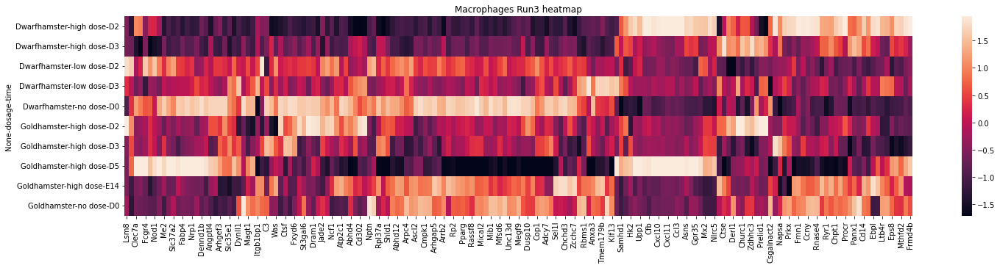

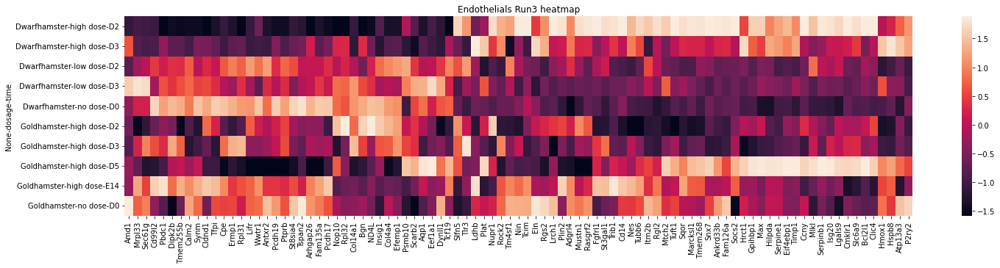

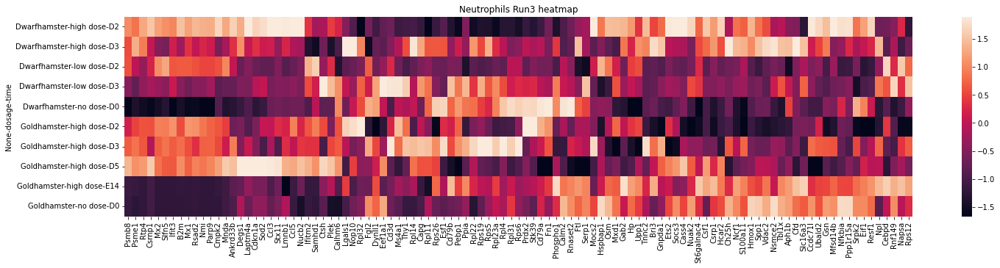

In [224]:
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages(f'{figure_path}/run3_timecourses.pdf') as pdf:
    for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
        key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
        adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

        df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf_interaction.csv', index_col=0)
        # annotate significance
        df['significant'] = False
        df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True
        df['score'] = -np.log10(df.padj)
        df['padj_rank'] = np.argsort(df.padj)

        # select
        sel_df = df[(df.significant) & (df.baseMean>np.median(df.baseMean))]
        sel_genes = list(np.intersect1d(sel_df.index, adata.var_names))

        # plot heatmap
        sdf = extract_df(adata, ['orig.ident', 'organism', 'dosage', 'time', 'organism_time', 'organism_dosage', 'organism_dosage_time'] + sel_genes)
        mat = sdf.groupby(['organism', 'dosage', 'time']).mean().dropna()
        mat = pd.concat({'Dwarfhamster': zscore(mat.loc['Dwarfhamster'], axis=0), 'Goldhamster': zscore(mat.loc['Goldhamster'], axis=0)})
        mat = cluster_matrix(mat, how='col')
        fig, ax = pl.subplots(1,1, figsize=[24,5])
        sns.heatmap(data=mat, robust=True)
        ax.set_title(f'{celltype} Run3 heatmap')
        pdf.savefig(bbox_inches='tight')
        pl.show()

        plot_timecourse_dose(adata, sel_genes)
        pdf.savefig(bbox_inches='tight')
        pl.close()

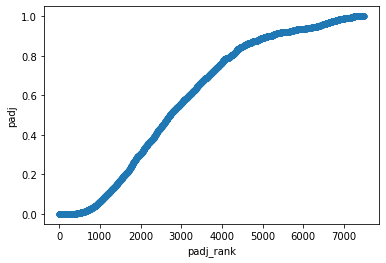

In [32]:
sns.scatterplot(data=df, x='padj_rank', y='padj', linewidth=0)
# pl.xscale('log')
pl.show()

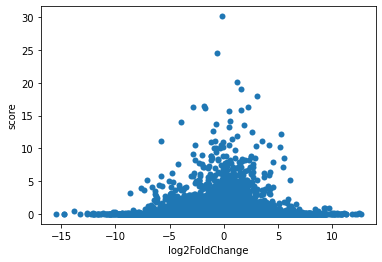

In [17]:
sns.scatterplot(data=df, x='log2FoldChange', y='score', linewidth=0)
pl.show()

# Run4: Specific interaction model

In [521]:
l2fc_lim = 2  # gene must have a higher absolute l2fc than this
alpha = 0.001  # significance cut-off for DE testing
min_counts = 10  # gene must have these many counts in all considered samples
alpha_gsea = 0.05  # significance cut-off for GSEA
min_pcells = 5  # gene must be found in at least these many cells (in percent) in all considered samples

results = {}
results2 = {}

for celltype in ['Macrophages', 'Endothelials', 'Neutrophils']:
    key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
    adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

    df = pd.read_csv(f'deseq2_results_{celltype}_GoldvsDwarf_specific_interaction_D2.csv', index_col=0)
    # annotate significance
    df['significant'] = False
    df['significant'][(df.padj<alpha) & (np.abs(df.log2FoldChange)>l2fc_lim)] = True

    # annotate expression
    df['expressed_in'] = None
    df['enough_cells_in'] = None
    for organism in ['Dwarfhamster', 'Goldhamster']:
        in_vars = df.index[np.isin(df.index, adata.var_names)]
        mask = (adata.obs.organism==organism) & (adata.obs.dosage!='low dose') & (adata.obs.time.isin(['D0', 'D2']))
        df.loc[in_vars, f'{organism}_counts'] = rsum(adata[mask, in_vars].layers['counts'], axis=0)
        df.loc[in_vars, f'{organism}_cells'] = rsum(adata[mask, in_vars].layers['counts'].A>0, axis=0)
        df.loc[in_vars, f'{organism}_pcells'] = 100 * df.loc[in_vars, f'{organism}_cells'] / np.sum(mask)
        df.loc[df[f'{organism}_counts'] > min_counts, 'expressed_in'] = organism
        df.loc[df[f'{organism}_pcells'] > min_pcells, 'enough_cells_in'] = organism
    
    df['expressed_in'][(df.Goldhamster_counts>min_counts) & (df.Dwarfhamster_counts>min_counts)] = 'Both' 
    df['enough_cells_in'][(df.Goldhamster_pcells>min_pcells) & (df.Dwarfhamster_pcells>min_pcells)] = 'Both' 

    # select significant and sufficiently expressed and enough cells
    sdf = df[(df.expressed_in=='Both') & (df.enough_cells_in=='Both') & (df.significant)]
    results[celltype] = annotate_genes(sdf, tab)
    
    r = gseapy_enrichr(sdf.index, df.index, species='human', cutoff=alpha_gsea)
    results2[celltype] = r
    
    print(f'{celltype}:\tFound {len(sdf)} filtered DEGs enriched for {len(r)} gene sets.')

100%|██████████| 94/94 [00:01<00:00, 77.43it/s]


Macrophages:	Found 94 filtered DEGs enriched for 19 gene sets.


100%|██████████| 64/64 [00:00<00:00, 78.19it/s]


Endothelials:	Found 64 filtered DEGs enriched for 2 gene sets.


100%|██████████| 62/62 [00:00<00:00, 77.88it/s]


Neutrophils:	Found 62 filtered DEGs enriched for 37 gene sets.


In [522]:
celltype='Neutrophils'
df = results[celltype]

In [523]:
key = '_endos' if celltype=='Endothelials' else '_macros' if celltype=='Macrophages' else '_neutros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')

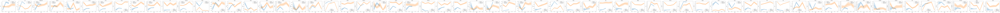

In [524]:
# nice
plot_timecourse(adata, df.index)

# example analysis (old)

In [290]:
time = 'D2'
celltype='Neutrophils'
l2fc_lim = 0.5
alpha=0.01

# merge organisms
df_d = pd.read_csv(f'deseq2_results_{celltype}_Dwarfhamster_{time}.csv', index_col=0)
df_d.columns = [c+'_d' for c in df_d.columns]
df_g = pd.read_csv(f'deseq2_results_{celltype}_Goldhamster_{time}.csv', index_col=0)
df_g.columns = [c+'_g' for c in df_g.columns]
df = pd.concat([df_d, df_g], axis=1)

In [291]:
# annotate significance
sig_d = (np.abs(df.log2FoldChange_d)>l2fc_lim) & (df.padj_d<alpha)
sig_g = (np.abs(df.log2FoldChange_g)>l2fc_lim) & (df.padj_g<alpha)
df['significance'] = 'Not significant'
df['significance'][sig_d & ~sig_g] = 'Dwarf only'
df['significance'][sig_g & ~sig_d] = 'Gold only'
df['significance'][sig_g & sig_d] = 'Both'

In [292]:
df

,baseMean_d,log2FoldChange_d,lfcSE_d,stat_d,pvalue_d,padj_d,baseMean_g,log2FoldChange_g,lfcSE_g,stat_g,pvalue_g,padj_g,significance
Oas1c,1849.444703,6.610448,0.360611,275.725556,1.339542e-60,1.141424e-56,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi27,3951.341157,6.029407,0.313706,224.537414,1.747109e-49,7.443559e-46,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi27l2b,74526.705587,5.009099,0.294811,174.199958,1.489223e-38,4.229891e-35,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi207,664.665279,4.007063,0.286599,165.288712,1.282367e-36,2.731762e-33,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Xaf1,717.145668,3.822756,0.275336,155.184154,2.005345e-34,3.417509e-31,2.599348,3.545782,1.295033,19.402821,0.000655,0.005316,Both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Nkain1,NaN,NaN,NaN,NaN,NaN,NaN,0.921934,-0.018056,1.565592,0.139891,0.997665,NaN,Not significant
Dusp11,NaN,NaN,NaN,NaN,NaN,NaN,13.343482,-0.127479,0.451681,0.107742,0.998600,0.999326,Not significant
Ankh,NaN,NaN,NaN,NaN,NaN,NaN,2.404847,0.169986,1.052077,0.095251,0.998901,0.999326,Not significant
Pdk3,NaN,NaN,NaN,NaN,NaN,NaN,0.747276,0.388177,1.988786,0.090231,0.999012,NaN,Not significant


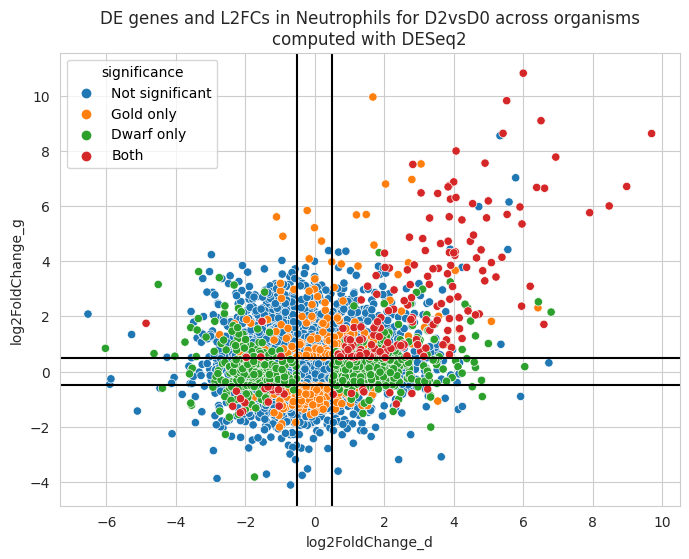

In [182]:
# plot l2fc in organisms and significance
with sns.axes_style('whitegrid'):
    fig, ax = pl.subplots(figsize=[8,6], dpi=100)
sns.scatterplot(data=df.sort_values('significance', ascending=False), x='log2FoldChange_d', y='log2FoldChange_g', hue='significance', ax=ax)
ax.axhline(l2fc_lim, c='k')
ax.axhline(-l2fc_lim, c='k')
ax.axvline(l2fc_lim, c='k')
ax.axvline(-l2fc_lim, c='k')
pl.title(f'DE genes and L2FCs in {celltype} for {time}vsD0 across organisms\ncomputed with DESeq2')
pl.show()

## Genes only significant in one

In [299]:
# only in gold
B = df[df.significance=='Gold only']
print(len(B))
res = gseapy_enrichr(B.index, df.index, 'mouse', cutoff=0.01)
res

398


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,CUSTOM22698580683264,Interferon Gamma Response,26/187,1.987520e-09,9.341346e-08,4.141970,IFI35;IL15;ITGB7;PSMA3;CFB;CD40;TOR1B;CCL5;IFI...
1,CUSTOM22698580683264,TNF-alpha Signaling via NF-kB,22/186,6.430467e-07,1.511160e-05,3.486416,TNF;SLC2A3;BTG2;SDC4;RELB;CCL5;FOS;ATP2B1;PHLD...
2,CUSTOM22698292888064,Spinal Cord Injury WP2432,13/63,2.299711e-07,2.667665e-05,6.006102,CXCL2;RHOB;TNFSF13B;ARG1;PPP3CA;LTB;ZFP36;CCNG...
3,CUSTOM22698580683264,Allograft Rejection,18/160,1.364159e-05,2.137182e-04,3.288849,GZMA;IL15;PSMB10;NLRP3;FYB1;LTB;CAPG;EIF5A;CD4...
4,CUSTOM22698580683264,Inflammatory Response,15/159,5.006725e-04,5.882901e-03,2.736588,IL15;NLRP3;MARCO;CD48;EBI3;CD40;LY6E;TNFSF9;CC...
5,CUSTOM22698292888064,Serotonin and anxiety-related events WP2140,3/4,1.703394e-04,9.879688e-03,21.389241,FOS;PRKCB;PPP3CA


In [300]:
# only in dwarf
B = df[df.significance=='Dwarf only']
print(len(B))
res = gseapy_enrichr(B.index, df.index, 'mouse', cutoff=0.01)
res

797


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,CUSTOM22698282589312,Cytoplasmic Ribosomal Proteins WP163,29/75,5.911546e-15,7.448548e-13,5.635868,RPL6;RPS26;RPLP1;RPS19;RPL8;RPS8;RPS27A;RPS4X;...
1,CUSTOM22698288961024,Ribosome,35/124,5.433323e-13,1.494164e-10,4.128302,RPL6;RPS26;RPLP1;RPS19;RPL8;RPS8;RPL10;RPS4X;R...
2,CUSTOM22698282537024,Interferon Gamma Response,33/187,8.375215e-07,4.103855e-05,2.559747,NFKBIA;CSF2RB;ZNFX1;CXCL11;PELI1;CDKN1A;IL18BP...
3,CUSTOM22698288961024,Glycolysis / Gluconeogenesis,12/43,2.860000e-05,3.932501e-03,3.990875,PFKL;GALM;PKM;LDHA;PGK1;TPI1;BPGM;ADPGK;HK3;AL...


## Up in one, down in other (Quadrant II and IV)

In [301]:
B = df[df.significance=='Both']
B['log2FoldChange_g_vs_d'] = B['log2FoldChange_g'] / B['log2FoldChange_d']

In [302]:
B.sort_values('log2FoldChange_g_vs_d')

,baseMean_d,log2FoldChange_d,lfcSE_d,stat_d,pvalue_d,padj_d,baseMean_g,log2FoldChange_g,lfcSE_g,stat_g,pvalue_g,padj_g,significance,log2FoldChange_g_vs_d
Nr3c1,193.025929,0.530059,0.322064,20.008839,4.519973e-05,7.672249e-04,66.537778,-0.822869,0.227518,23.544743,9.853616e-05,1.034399e-03,Both,-1.552410
Rpl35a,558.377480,-1.520765,0.410100,14.923155,5.747487e-04,5.734700e-03,393.006230,1.820410,0.511769,32.085496,1.837649e-06,2.909539e-05,Both,-1.197036
Klf6,1095.058099,1.054683,0.310365,19.205061,6.755756e-05,1.071989e-03,712.676655,-0.787743,0.170232,103.183391,2.065040e-21,1.543961e-19,Both,-0.746900
Id2,55.255104,-0.972684,0.316280,27.356416,1.147175e-06,3.429852e-05,227.880909,0.552582,0.212883,20.636945,3.737079e-04,3.295780e-03,Both,-0.568100
Ptgs2,1229.893625,1.412661,0.282345,28.666821,5.957704e-07,1.945042e-05,132.072279,-0.733326,0.216093,69.164697,3.406525e-14,1.508059e-12,Both,-0.519110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Psme1,452.104591,1.766831,0.295138,31.739188,1.282103e-07,4.877142e-06,154.993507,3.478465,0.253424,375.508619,5.435460e-80,2.151483e-77,Both,1.968760
Samhd1,375.302403,1.522779,0.282939,36.571715,1.144334e-08,5.603950e-07,62.979770,3.094036,0.304943,180.750706,5.144131e-38,8.875605e-36,Both,2.031835
Mnda,1495.770651,3.059946,0.287952,107.154550,5.391195e-24,1.997320e-21,183.959448,6.473735,0.730550,134.885127,3.510696e-28,4.542975e-26,Both,2.115637
B2m,5607.529838,2.009251,0.212374,85.073194,3.361946e-19,7.345421e-17,1077.246860,4.290493,0.234703,610.766027,7.246145e-131,5.417701e-128,Both,2.135369


In [127]:
cached = "/fast/scratch/users/peidlis_c/Pancov19_prepd_neutros.h5"
mdata = sc.read(cached)

In [128]:
B_n = B[B['log2FoldChange_g_vs_d']<0]
gseapy_enrichr(B_n.index, df.index, 'mouse', cutoff=0.01)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,CUSTOM22698984945344,TNF-alpha Signaling via NF-kB,4/186,0.000046,0.000777,26.482676,KLF6;HES1;PTGS2;ID2
1,CUSTOM22699386236672,Id Signaling Pathway WP512,2/36,0.000757,0.008327,56.732323,HES1;ID2
2,CUSTOM22699386236672,SIDS Susceptibility Pathways WP1266,2/26,0.000393,0.008327,78.622378,HES1;NR3C1


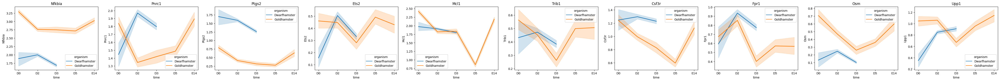

In [118]:
genes = specify_genes('NFKBIA;PNRC1;PTGS2;ETS2;MCL1;TRIB1;CSF3R;FPR1;OSM;UPP1'.split(';'), 'human', 'mouse')
plot_timecourse(mdata, genes, 'time')

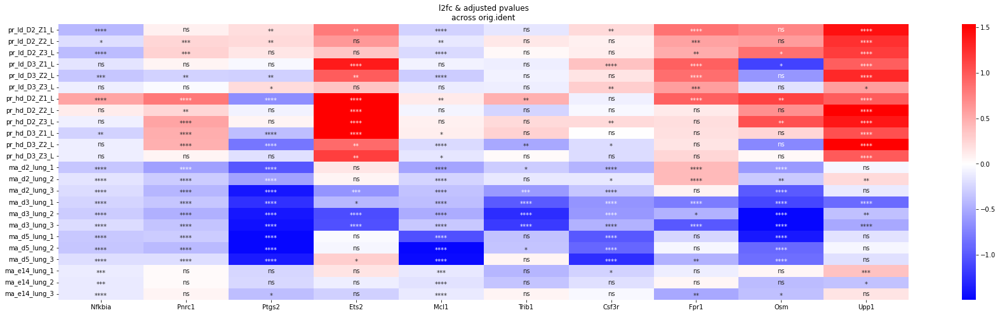

In [119]:
control_dict = {x: ['pr_D0_Z1_L','pr_D0_Z2_L','pr_D0_Z3_L'] if 'pr' in x else ['ma_d0_lung_1', 'ma_d0_lung_2', 'ma_d0_lung_3'] for x in pd.unique(mdata.obs['orig.ident']) if '0' not in x}
control_dict_odt = {
    'Dwarfhamster_low dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_low dose_D3': 'Dwarfhamster_no dose_D0', 
    'Dwarfhamster_high dose_D2': 'Dwarfhamster_no dose_D0',
    'Dwarfhamster_high dose_D3': 'Dwarfhamster_no dose_D0',
    'Goldhamster_high dose_D2': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_D3': 'Goldhamster_no dose_D0',
    'Goldhamster_high dose_D5': 'Goldhamster_no dose_D0', 
    'Goldhamster_high dose_E14': 'Goldhamster_no dose_D0'
}

# genes = np.sum([[x for x in v if x in mdata.var_names or x in mdata.obs.keys()] for v in special_genes.values()])
pl.figure(figsize=[30,8])
plot_differential_test(mdata, genes, 'orig.ident', control=control_dict, sort_groups=False, cluster=None)#, vmin=-2, vmax=2

## use deseq values to plot l2fc heatmap

In [303]:
df.head()

,baseMean_d,log2FoldChange_d,lfcSE_d,stat_d,pvalue_d,padj_d,baseMean_g,log2FoldChange_g,lfcSE_g,stat_g,pvalue_g,padj_g,significance
Oas1c,1849.444703,6.610448,0.360611,275.725556,1.339542e-60,1.141424e-56,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi27,3951.341157,6.029407,0.313706,224.537414,1.747109e-49,7.443559e-46,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi27l2b,74526.705587,5.009099,0.294811,174.199958,1.489223e-38,4.229891e-35,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Ifi207,664.665279,4.007063,0.286599,165.288712,1.282367e-36,2.731762e-33,NaN,NaN,NaN,NaN,NaN,NaN,Dwarf only
Xaf1,717.145668,3.822756,0.275336,155.184154,2.005345e-34,3.417509e-31,2.599348,3.545782,1.295033,19.402821,0.000655,0.005316,Both


In [350]:
l2fc = {}
padj = {}
celltype = 'Neutrophils'
# for celltype in ['Neutrophils', 'Macrophages', 'Endothelials']:
for organism in ['Dwarfhamster', 'Goldhamster']:
    times = ['D2', 'D3'] if organism=='Dwarfhamster' else ['D2', 'D3', 'D5', 'E14']
    for time in times:
        df_ = pd.read_csv(f'deseq2_results_{celltype}_{organism}_{time}.csv', index_col=0)
        l2fc[f'{organism}_{time}_vs_D0'] = df_['log2FoldChange']
        padj[f'{organism}_{time}_vs_D0'] = df_['padj']
l2fc_tab = pd.concat(l2fc, axis=1)
padj_tab = pd.concat(padj, axis=1)

In [398]:
sdf = df[((df['significance']=='Dwarf only') & (df['baseMean_g']>20)) | ((df['significance']=='Gold only') & (df['baseMean_d']>20)) | ((df['significance']=='Both') & (df['baseMean_g']>20) & (df['baseMean_d']>20))]
len(sdf)

638

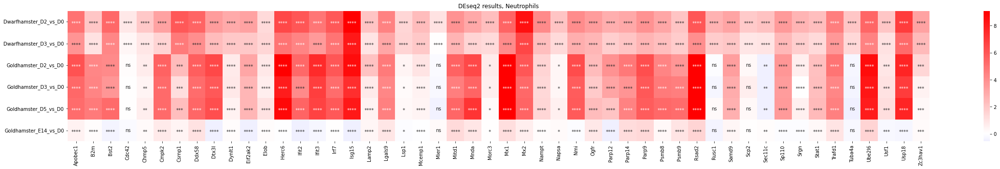

In [399]:
genes = np.intersect1d(sdf.index[:50], l2fc_tab.index)
pl.figure(figsize=[40,5])
cg = sns.heatmap(l2fc_tab.loc[genes].T, cmap='bwr', center=0, robust=True, mask=pd.isna(padj_tab.loc[genes].T),
                annot=format_pvals(padj_tab.loc[genes].values.T), fmt='')
cg.set_facecolor('grey')
pl.title(f'DEseq2 results, {celltype}')
pl.show()

In [414]:
genes = np.intersect1d(sdf.index, l2fc_tab.index)
tabo = l2fc_tab.loc[genes].T
tabo = cluster_matrix(tabo, 'col')

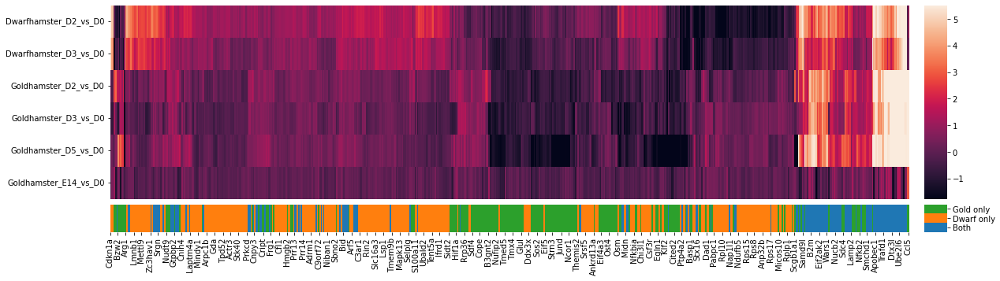

In [425]:
hwc = heatmap_with_cats(tabo, col_labels=df.loc[tabo.columns, 'significance'], robust=True, show=False, figsize=[20,5])
x = np.linspace(0, tabo.shape[-1]-1, 100).astype(int)
hwc['ax_x'].set_xticks(x)
hwc['ax_x'].set_xticklabels(tabo.columns[x], rotation=90)
pl.show()

# Bla

In [34]:
# Execute run2 auto code first

In [21]:
# 2 times TNFa signalling via NF-kB with different genes even
tab = pd.concat(results)
tab

baseMean  log2FoldChange  \
Macrophages_Dwarfhamster_D2 Mx2           357.943793        7.497275   
                            Herc6        1096.710460        4.688009   
                            Eif2ak2       758.570282        2.103623   
                            Ddx58         651.491164        3.317693   
                            Samd9        1614.312267        2.039094   
...                                              ...             ...   
Neutrophils_Goldhamster_D3  Parp10          8.475028        2.657976   
                            Shfl            3.698391        3.633753   
                            CUNH20orf27     8.063244        2.015860   
                            Batf2           2.849390        4.221694   
                            Nlrc5           2.840485        5.028568   

                                            lfcSE        stat        pvalue  \
Macrophages_Dwarfhamster_D2 Mx2          0.606456  193.977611  7.556086e-43   
                            Herc6        0.322423  141.893330  1.542605e-31   
                            Eif2ak2      0.173426  132.627952  1.585645e-29   
                            Ddx58        0.262353  126.521986  3.358148e-28   
                            Samd9        0.185600  108.019639  3.498110e-24   
...                                           ...         ...           ...   
Neutrophils_Goldhamster_D3  Parp10       0.768369   30.779511  3.395366e-06   
                            Shfl         1.432785   30.263381  4.325838e-06   
                            CUNH20orf27  0.796632   30.177843  4.502894e-06   
                            Batf2        1.541794   28.764616  8.726989e-06   
                            Nlrc5        1.451681   24.333383  6.847777e-05   

                                                 padj  significant  \
Macrophages_Dwarfhamster_D2 Mx2          3.807890e-39         True   
                            Herc6        3.109584e-28         True   
                            Eif2ak2      2.283103e-26         True   
                            Ddx58        4.230847e-25         True   
                            Samd9        3.205223e-21         True   
...                                               ...          ...   
Neutrophils_Goldhamster_D3  Parp10       5.065947e-05         True   
                            Shfl         6.273398e-05         True   
                            CUNH20orf27  6.474353e-05         True   
                            Batf2        1.186342e-04         True   
                            Nlrc5        7.360813e-04         True   

                                         Dwarf_mean  Gold_mean expressed_in  
Macrophages_Dwarfhamster_D2 Mx2            0.194004   1.053932         Both  
                            Herc6          0.487511   0.416561         Both  
                            Eif2ak2        0.377040   0.367145         Both  
                            Ddx58          0.327408   0.252552         Both  
                            Samd9          0.695951   0.680390         Both  
...                                             ...        ...          ...  
Neutrophils_Goldhamster_D3  Parp10         0.307773   0.049390         Both  
                            Shfl           0.422378   0.033157         Both  
                            CUNH20orf27    0.012911   0.049252         Both  
                            Batf2          0.031224   0.059905         Both  
                            Nlrc5          0.365374   0.020697         Both  

[922 rows x 10 columns]

In [22]:
tabo = tab.reset_index()
tabo['time'] = [x.split('_')[-1] for x in tabo['level_0']]
tabo['organism'] = [x.split('_')[1] for x in tabo['level_0']]
tabo['celltype'] = [x.split('_')[0] for x in tabo['level_0']]

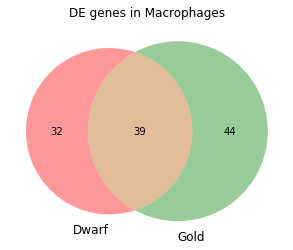

In [23]:
celltype = 'Macrophages'
Dgenes = tabo[(tabo.celltype==celltype) & (tabo.organism=='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1
Ggenes = tabo[(tabo.celltype==celltype) & (tabo.organism!='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1

from matplotlib_venn import venn2
venn2([set(Dgenes), set(Ggenes)], ['Dwarf', 'Gold'])
pl.title(f'DE genes in {celltype}')
pl.show()

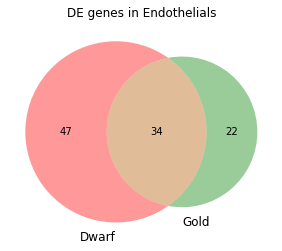

In [24]:
celltype = 'Endothelials'
Dgenes = tabo[(tabo.celltype==celltype) & (tabo.organism=='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1
Ggenes = tabo[(tabo.celltype==celltype) & (tabo.organism!='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1

from matplotlib_venn import venn2
venn2([set(Dgenes), set(Ggenes)], ['Dwarf', 'Gold'])
pl.title(f'DE genes in {celltype}')
pl.show()

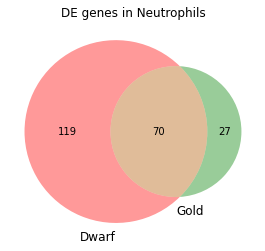

In [25]:
celltype = 'Neutrophils'
Dgenes = tabo[(tabo.celltype==celltype) & (tabo.organism=='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1
Ggenes = tabo[(tabo.celltype==celltype) & (tabo.organism!='Dwarfhamster') & tabo.time.isin(['D2', 'D3'])].level_1

from matplotlib_venn import venn2
venn2([set(Dgenes), set(Ggenes)], ['Dwarf', 'Gold'])
pl.title(f'DE genes in {celltype}')
pl.show()

In [26]:
# GSEA on genes DE in one organism but not in the other.
tab2 = pd.concat(results2)
tab2

Gene_set  \
Macrophages_Dwarfhamster_D2 0   CUSTOM22426212856000   
                            1   CUSTOM22426212856000   
                            2   CUSTOM22426212856000   
                            3   CUSTOM22425104518464   
                            4   CUSTOM22425104418496   
...                                              ...   
Neutrophils_Goldhamster_D3  11  CUSTOM22433564240256   
                            12  CUSTOM22431259391488   
                            13  CUSTOM22433564240256   
                            14  CUSTOM22431259391488   
                            15  CUSTOM22437315844864   

                                                                           Term  \
Macrophages_Dwarfhamster_D2 0                         Interferon Gamma Response   
                            1                         Interferon Alpha Response   
                            2                             Inflammatory Response   
                            3                                       Influenza A   
                            4        Type II interferon signaling (IFNG) WP1253   
...                                                                         ...   
Neutrophils_Goldhamster_D3  11            RIG-I-like receptor signaling pathway   
                            12                         IL-6/JAK/STAT3 Signaling   
                            13  Kaposi sarcoma-associated herpesvirus infection   
                            14                    TNF-alpha Signaling via NF-kB   
                            15                     Proteasome Degradation WP519   

                               Overlap       P-value  Adjusted P-value  \
Macrophages_Dwarfhamster_D2 0   43/174  3.429854e-62      8.917621e-61   
                            1    33/91  5.496866e-53      7.145926e-52   
                            2   15/161  2.977262e-14      2.580294e-13   
                            3   14/118  7.744148e-15      6.350201e-13   
                            4     8/29  4.800223e-12      2.208103e-10   
...                                ...           ...               ...   
Neutrophils_Goldhamster_D3  11    6/45  2.707624e-06      3.287830e-05   
                            12    6/63  1.986179e-05      9.930895e-05   
                            13   8/125  1.516922e-05      1.611730e-04   
                            14   8/168  1.256009e-04      5.233370e-04   
                            15    5/45  4.800058e-05      8.160098e-04   

                                Odds Ratio  \
Macrophages_Dwarfhamster_D2 0   100.688735   
                            1   110.259243   
                            2    19.576399   
                            3    24.616217   
                            4    52.892166   
...                                    ...   
Neutrophils_Goldhamster_D3  11   16.966958   
                            12   12.132358   
                            13    8.193325   
                            14    6.072109   
                            15   14.163950   

                                                                            Genes  
Macrophages_Dwarfhamster_D2 0   PARP12;CXCL11;XAF1;CCL5;IFIH1;RSAD2;ZBP1;UBE2L...  
                            1   PARP12;MOV10;CXCL11;SAMD9;IFIH1;RSAD2;UBA7;UBE...  
                            2   BST2;CXCL9;EIF2AK2;CXCL11;TNFSF10;CCRL2;CXCL10...  
                            3   IFIH1;RSAD2;MX2;DDX58;EIF2AK2;STAT1;TNFSF10;PM...  
                            4   CXCL9;EIF2AK2;STAT1;CXCL10;ISG15;IRF9;IFIT2;STAT2  
...                                                                           ...  
Neutrophils_Goldhamster_D3  11                IFIH1;DDX58;DHX58;CXCL10;ISG15;IRF7  
                            12                STAT1;CXCL10;IL15RA;IRF9;STAT2;BAK1  
                            13      EIF2AK2;ICAM1;STAT1;IRF9;STAT2;BAK1;E2F2;IRF7  
                            14    IFIH1;DDX58;ICAM1;TAP1;IL15RA;CXCL10;IFIT2;CCL5  
        

In [30]:
tabo2 = tab2.reset_index()
tabo2['time'] = [x.split('_')[-1] for x in tabo2['level_0']]
tabo2['organism'] = [x.split('_')[1] for x in tabo2['level_0']]
tabo2['celltype'] = [x.split('_')[0] for x in tabo2['level_0']]

In [33]:
tabo2.head()

,level_0,level_1,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,time,organism,celltype
0,Macrophages_Dwarfhamster_D2,0,CUSTOM22426212856000,Interferon Gamma Response,43/174,3.429854e-62,8.917621e-61,100.688735,PARP12;CXCL11;XAF1;CCL5;IFIH1;RSAD2;ZBP1;UBE2L...,D2,Dwarfhamster,Macrophages
1,Macrophages_Dwarfhamster_D2,1,CUSTOM22426212856000,Interferon Alpha Response,33/91,5.496866e-53,7.145926e-52,110.259243,PARP12;MOV10;CXCL11;SAMD9;IFIH1;RSAD2;UBA7;UBE...,D2,Dwarfhamster,Macrophages
2,Macrophages_Dwarfhamster_D2,2,CUSTOM22426212856000,Inflammatory Response,15/161,2.977262e-14,2.580294e-13,19.576399,BST2;CXCL9;EIF2AK2;CXCL11;TNFSF10;CCRL2;CXCL10...,D2,Dwarfhamster,Macrophages
3,Macrophages_Dwarfhamster_D2,3,CUSTOM22425104518464,Influenza A,14/118,7.744148e-15,6.350201e-13,24.616217,IFIH1;RSAD2;MX2;DDX58;EIF2AK2;STAT1;TNFSF10;PM...,D2,Dwarfhamster,Macrophages
4,Macrophages_Dwarfhamster_D2,4,CUSTOM22425104418496,Type II interferon signaling (IFNG) WP1253,8/29,4.800223e-12,2.208103e-10,52.892166,CXCL9;EIF2AK2;STAT1;CXCL10;ISG15;IRF9;IFIT2;STAT2,D2,Dwarfhamster,Macrophages


In [32]:
# Percent sets in which a term is present in enrichment:
np.round(tabo2.Term.value_counts() / len(pd.unique(tab2.index.get_level_values(0))) * 100,0)

Interferon Gamma Response                          100.0
Interferon Alpha Response                          100.0
Influenza A                                        100.0
Type II interferon signaling (IFNG) WP1253         100.0
RIG-I-like receptor signaling pathway              100.0
Hepatitis C                                         92.0
TNF-alpha Signaling via NF-kB                       92.0
Inflammatory Response                               83.0
Herpes simplex virus 1 infection                    83.0
Epstein-Barr virus infection                        83.0
Measles                                             75.0
IL-6/JAK/STAT3 Signaling                            67.0
Cytosolic DNA-sensing pathway                       67.0
Allograft Rejection                                 50.0
Toll-like receptor signaling pathway                33.0
Complement                                          25.0
Cytokine-cytokine receptor interaction              25.0
Prion diseases                 

# Cross-run overlaps

In [109]:
keys = ['Macrophages_Dwarfhamster_D2', 'Macrophages_Dwarfhamster_D3', 'Macrophages_Goldhamster_D2', 'Macrophages_Goldhamster_D3', 
        'Endothelials_Dwarfhamster_D2', 'Endothelials_Dwarfhamster_D3', 'Endothelials_Goldhamster_D2', 'Endothelials_Goldhamster_D3', 
        'Neutrophils_Dwarfhamster_D2', 'Neutrophils_Dwarfhamster_D3', 'Neutrophils_Goldhamster_D2', 'Neutrophils_Goldhamster_D3']

In [110]:
celltype = 'Macrophages'
skeys = [ckey.replace('hamster', '') for ckey in keys if celltype in ckey]
r=[pd.read_excel('run1_results.xlsx', index_col=0, sheet_name=f'{key}_DEGs') for key in skeys]
tab1 = pd.concat(r).drop_duplicates()
tab2 = pd.read_excel('run2_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')
tab3 = pd.read_excel('run3_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')

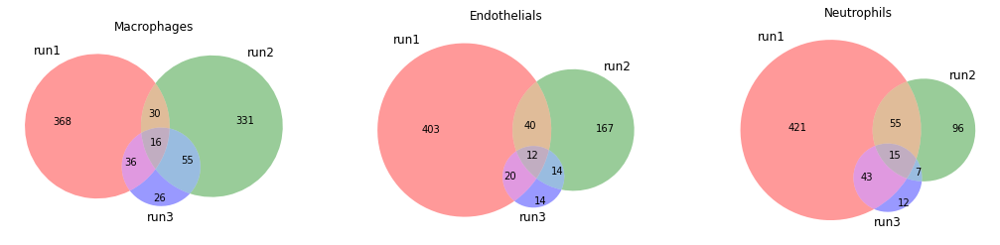

In [111]:
from matplotlib_venn import venn3
fig, axs = pl.subplots(1,3, figsize=[6*3,4])
for ax, celltype in zip(axs, ['Macrophages', 'Endothelials', 'Neutrophils']):
    skeys = [ckey.replace('hamster', '') for ckey in keys if celltype in ckey]
    r=[pd.read_excel('run1_results.xlsx', index_col=0, sheet_name=f'{key}_DEGs') for key in skeys]
    tab1 = pd.concat(r)
    tab1 = tab1[~tab1.index.duplicated(keep='first')]
    tab2 = pd.read_excel('run2_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')
    tab3 = pd.read_excel('run3_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')
    venn3([set(x.index) for x in [tab1, tab2, tab3]], ['run1', 'run2', 'run3'], ax=ax)
    ax.set_title(f'{celltype}')
pl.show()

In [112]:
from matplotlib_venn import venn3
tabs = {}
for ax, celltype in zip(axs, ['Macrophages', 'Endothelials', 'Neutrophils']):
    skeys = [ckey.replace('hamster', '') for ckey in keys if celltype in ckey]
    r=[pd.read_excel('run1_results.xlsx', index_col=0, sheet_name=f'{key}_DEGs') for key in skeys]
    tab1 = pd.concat(r)
    tab1 = tab1[~tab1.index.duplicated(keep='first')]
    tab2 = pd.read_excel('run2_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')
    tab3 = pd.read_excel('run3_results.xlsx', index_col=0, sheet_name=f'{celltype}_DEGs')
    tabs[f'tab1_{celltype}'] = tab1
    tabs[f'tab2_{celltype}'] = tab2
    tabs[f'tab3_{celltype}'] = tab3

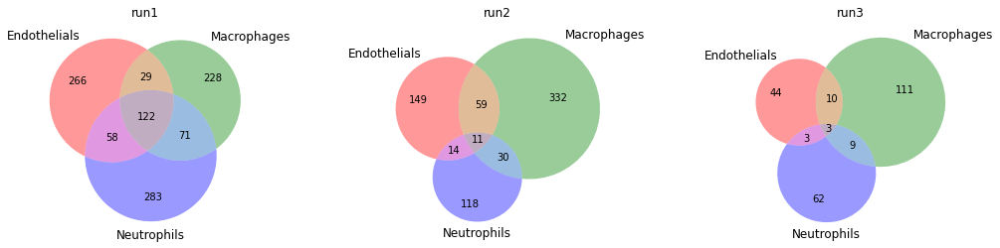

In [113]:
fig, axs = pl.subplots(1,3, figsize=[6*3,4])
for ax, run in zip(axs, ['1', '2', '3']):
    tabE = tabs[f'tab{run}_Endothelials']
    tabM = tabs[f'tab{run}_Macrophages']
    tabN = tabs[f'tab{run}_Neutrophils']
    venn3([set(x.index) for x in [tabE, tabM, tabN]], ['Endothelials', 'Macrophages', 'Neutrophils'], ax=ax)
    ax.set_title(f'run{run}')
pl.show()

In [114]:
run='3'
tabE = tabs[f'tab{run}_Endothelials']
tabM = tabs[f'tab{run}_Macrophages']
tabN = tabs[f'tab{run}_Neutrophils']
common_3 = intersect_many([tabE.index, tabM.index, tabN.index])
common_3

array(['Calm2', 'Hmox1', 'Rpl32'], dtype=object)

In [115]:
run='2'
tabE = tabs[f'tab{run}_Endothelials']
tabM = tabs[f'tab{run}_Macrophages']
tabN = tabs[f'tab{run}_Neutrophils']
common_2 = intersect_many([tabE.index, tabM.index, tabN.index])
common_2

array(['Actr3', 'Calm1', 'Calm2', 'Dtx3l', 'Edf1', 'Hnrnpu', 'Hspa8',
       'Irf9', 'Lamp2', 'Rpl32', 'Tpt1'], dtype=object)

In [116]:
run='1'
tabE = tabs[f'tab{run}_Endothelials']
tabM = tabs[f'tab{run}_Macrophages']
tabN = tabs[f'tab{run}_Neutrophils']
common_1 = intersect_many([tabE.index, tabM.index, tabN.index])
common_1

array(['Apobec1', 'Apol11a', 'Arid5a', 'Batf2', 'Bst2', 'C2', 'C4a',
       'Casp3', 'Ccl5', 'Ccl8', 'Ccrl2', 'Cd14', 'Cdkn1a', 'Clic4',
       'Cmpk2', 'Cox18', 'Csf1', 'Csrnp1', 'Cxcl10', 'Cxcl11', 'Cxcl16',
       'Ddx58', 'Ddx60', 'Dhx58', 'Dtx3l', 'Dynlt1', 'Eif2ak2', 'Fgfrl1',
       'Gbp2', 'Gbp4', 'Gbp5', 'Gbp6', 'Gbp7', 'Gch1', 'Helz2', 'Herc6',
       'Hmox1', 'Hp', 'Hsh2d', 'Icam1', 'Ido1', 'Ifi27l2b', 'Ifi44',
       'Ifi47', 'Ifih1', 'Ifit1bl', 'Ifit2', 'Ifit3', 'Ifitm3', 'Igtp',
       'Il15ra', 'Irf7', 'Irf9', 'Irgm1', 'Irgm2', 'Isg15', 'Isg20',
       'Larp1b', 'Lgals3bp', 'Lgals9', 'Ly6e', 'Marcksl1', 'Mitd1',
       'Mnda', 'Mov10', 'Mx1', 'Mx2', 'Nampt', 'Nlrc5', 'Nmi', 'Nt5c3',
       'Oas1c', 'Oasl', 'Oasl2', 'Ogfr', 'Parp10', 'Parp12', 'Parp14',
       'Parp9', 'Pla2g5', 'Plin2', 'Pml', 'Ppp1r14c', 'Psmb8',
       'RT1-T24-4', 'Rnf114', 'Rnf213', 'Rpl32', 'Rsad2', 'Rtp4',
       'SCoV2_UTR3', 'Samd9', 'Samd9l', 'Samhd1', 'Serpinb9', 'Shfl',
       'Slc28a2', 'Slfn

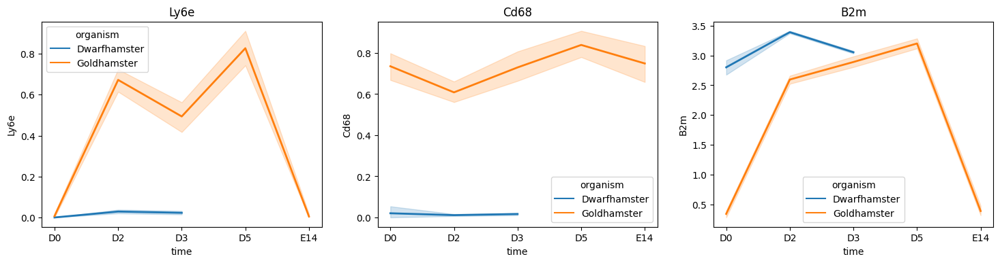

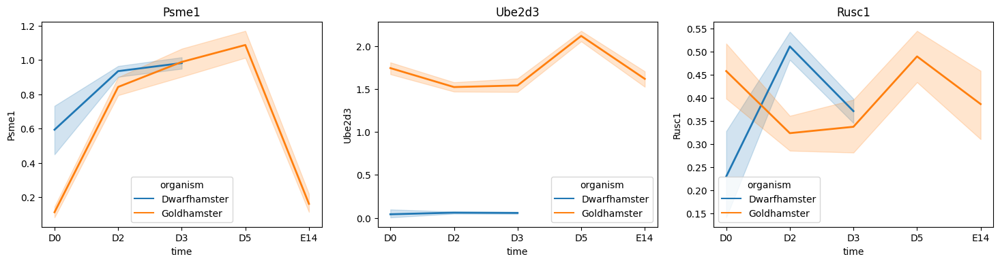

In [51]:
key = '_endos' if celltype=='Endothelials' else 'V2_macros' if celltype=='Macrophages' else '_neutros'
adata = sc.read(f'/fast/scratch/users/peidlis_c/Pancov19_prepd{key}.h5')
plot_timecourse(adata, ['Ly6e', 'Cd68', 'B2m'], 'time')
plot_timecourse(adata, ['Psme1', 'Ube2d3', 'Rusc1'], 'time')